In [1]:
import pandas as pd
import geopandas as gpd
import os 
import sys
import requests
import json
import io
import urllib
import zipfile
import matplotlib as plt
import statsmodels.formula.api as smf
from scipy.stats.stats import pearsonr  
%pylab inline

# User defined function that reads in API key.
from censusAPI import myAPI 

#Setting plot preferences  
import pylab as plot
params = {'legend.fontsize': 16,
          'legend.handlelength': 5,
          'legend.markerscale': 2}
plot.rcParams.update(params)

Populating the interactive namespace from numpy and matplotlib


/Users/rspd/anaconda3/lib/python3.6/site-packages/IPython/core/magics/pylab.py:160: UserWarning: pylab import has clobbered these variables: ['plt']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"


## Census Functions

The below two functions retrieve data from the 5 year ACS: https://www.census.gov/data/developers/data-sets/acs-5year.html

There are two functions, as this code uses two different tables: the subject tables (https://api.census.gov/data/2016/acs/acs5/subject/variables.html) and the detailed tables (https://api.census.gov/data/2016/acs/acs5/variables.html). 

The only difference between the two functions is the url string. The two functions could be combined into a singular function in future code. 

In [2]:
def censusSubject(variable):
    '''
    Returns a dataframe of an inputted census variables (from subject tables) at the census tract level
    Requires predefined variables: states
    Optional: Filter based on predefined counties variables 
    '''
    perm_df = pd.DataFrame()

    for state in states:
        url = "https://api.census.gov/data/2016/acs/acs5/subject?get=NAME," + variable + "&for=tract:*&in=state:" + state + "&key=" + myAPI
        resp = requests.request('GET', url)
        aff1y = json.loads(resp.text)
        
        resp = requests.request('GET', url).content
        temp_df = pd.read_csv(io.StringIO(resp.decode('utf-8').replace('[','').replace(']','')))
        print(temp_df.shape)
        perm_df = perm_df.append(temp_df)
    
    
    # Filter it based on a list of counties defined by user 
    # Can be hashed out if user does not want to filter 
    perm_df['stco'] = perm_df['state'].astype(str) + perm_df['county'].astype(str)
    perm_df = perm_df[perm_df['stco'].isin(counties)]
    print(perm_df.shape)
    
    return perm_df

In [3]:
def censusDetailed(variable):
    '''
    Returns a dataframe of an inputted census variables (from detailed tables) at the census tract level
    Requires predefined variables: states
    Optional: Filter based on predefined counties variables 
    '''
    perm_df = pd.DataFrame()

    for state in states:
        url = "https://api.census.gov/data/2016/acs/acs5?get=NAME," + variable + "&for=tract:*&in=state:" + state + "&key=" + myAPI
        resp = requests.request('GET', url)
        aff1y = json.loads(resp.text)
        
        resp = requests.request('GET', url).content
        temp_df = pd.read_csv(io.StringIO(resp.decode('utf-8').replace('[','').replace(']','')))
        print(temp_df.shape)
        perm_df = perm_df.append(temp_df)
    
    
    # Filter it based on a list of counties defined by user 
        # Can be hashed out if user does not want to filter 
    perm_df['stco'] = perm_df['state'].astype(str) + perm_df['county'].astype(str)
    perm_df = perm_df[perm_df['stco'].isin(counties)]
    print(perm_df.shape)
    
    return perm_df

# Core Statistical Area

CSAs are grouped geographies defined by the Census Bureau: *"Combined statistical areas (CSA) consist of two or more adjacent metropolitan and micropolitan statistical areas that have substantial employment interchange."*

More info: https://www.census.gov/geo/reference/webatlas/csa.html

In [4]:
# States by Census Codes
stateNY = '36'
stateNJ = '34'
stateCT = '09'
statePA = '42'

states = stateNY, stateNJ, stateCT, statePA
states

('36', '34', '09', '42')

#### CSA Delinitation File: https://www.census.gov/geographies/reference-files/time-series/demo/metro-micro/delineation-files.html

In [5]:
cbsa = pd.read_excel("https://www2.census.gov/programs-surveys/metro-micro/geographies/reference-files/2017/delineation-files/list1.xls", skiprows=2)
cbsa.head()

,CBSA Code,Metropolitan Division Code,CSA Code,CBSA Title,Metropolitan/Micropolitan Statistical Area,Metropolitan Division Title,CSA Title,County/County Equivalent,State Name,FIPS State Code,FIPS County Code,Central/Outlying County
0,10100,NaN,NaN,"Aberdeen, SD",Micropolitan Statistical Area,NaN,NaN,Brown County,South Dakota,46.0,13.0,Central
1,10100,NaN,NaN,"Aberdeen, SD",Micropolitan Statistical Area,NaN,NaN,Edmunds County,South Dakota,46.0,45.0,Outlying
2,10140,NaN,NaN,"Aberdeen, WA",Micropolitan Statistical Area,NaN,NaN,Grays Harbor County,Washington,53.0,27.0,Central
3,10180,NaN,NaN,"Abilene, TX",Metropolitan Statistical Area,NaN,NaN,Callahan County,Texas,48.0,59.0,Outlying
4,10180,NaN,NaN,"Abilene, TX",Metropolitan Statistical Area,NaN,NaN,Jones County,Texas,48.0,253.0,Outlying


In [6]:
# Filtering to just NY CSA 
cbsa = cbsa[cbsa['CSA Title'] == 'New York-Newark, NY-NJ-CT-PA']
print(cbsa.shape)
cbsa.head()

(35, 12)


,CBSA Code,Metropolitan Division Code,CSA Code,CBSA Title,Metropolitan/Micropolitan Statistical Area,Metropolitan Division Title,CSA Title,County/County Equivalent,State Name,FIPS State Code,FIPS County Code,Central/Outlying County
44,10900,NaN,408.0,"Allentown-Bethlehem-Easton, PA-NJ",Metropolitan Statistical Area,NaN,"New York-Newark, NY-NJ-CT-PA",Warren County,New Jersey,34.0,41.0,Central
45,10900,NaN,408.0,"Allentown-Bethlehem-Easton, PA-NJ",Metropolitan Statistical Area,NaN,"New York-Newark, NY-NJ-CT-PA",Carbon County,Pennsylvania,42.0,25.0,Central
46,10900,NaN,408.0,"Allentown-Bethlehem-Easton, PA-NJ",Metropolitan Statistical Area,NaN,"New York-Newark, NY-NJ-CT-PA",Lehigh County,Pennsylvania,42.0,77.0,Central
47,10900,NaN,408.0,"Allentown-Bethlehem-Easton, PA-NJ",Metropolitan Statistical Area,NaN,"New York-Newark, NY-NJ-CT-PA",Northampton County,Pennsylvania,42.0,95.0,Central
257,14860,NaN,408.0,"Bridgeport-Stamford-Norwalk, CT",Metropolitan Statistical Area,NaN,"New York-Newark, NY-NJ-CT-PA",Fairfield County,Connecticut,9.0,1.0,Central


In [7]:
cbsa['State Name'].value_counts()

New Jersey      14
New York        13
Pennsylvania     5
Connecticut      3
Name: State Name, dtype: int64

In [8]:
# Creating a combined state/county column for filtering census data
cbsa['FIPS State Code'] = cbsa['FIPS State Code'].astype(int)
cbsa['FIPS County Code'] = cbsa['FIPS County Code'].astype(int)
cbsa['STCT'] = cbsa['FIPS State Code'].astype(str) + cbsa['FIPS County Code'].astype(str)

# Checking the combination of state and county is unique 
print(cbsa.shape)
print(cbsa['STCT'].nunique())

# Creating list of counties based on combination of state and county
counties = list(cbsa['STCT'])
print("Included counties: FIPS State code & FIPS County code:", counties)

(35, 13)
35
Included counties: FIPS State code & FIPS County code: ['3441', '4225', '4277', '4295', '91', '4289', '36111', '99', '3627', '3679', '3659', '36103', '3413', '3419', '3427', '3435', '3437', '3439', '42103', '343', '3417', '3423', '3425', '3429', '3431', '365', '3647', '3661', '3671', '3681', '3685', '3687', '36119', '95', '3421']


# Shapefile

Source: https://www.census.gov/geo/maps-data/data/cbf/cbf_tracts.html

In [9]:
shpfile_ny = gpd.GeoDataFrame.from_file("cb_2016_36_tract_500k/cb_2016_36_tract_500k.shp")
shpfile_nj = gpd.GeoDataFrame.from_file('cb_2016_34_tract_500k/cb_2016_34_tract_500k.shp')
shpfile_pa = gpd.GeoDataFrame.from_file('cb_2016_42_tract_500k/cb_2016_42_tract_500k.shp')
shpfile_ct = gpd.GeoDataFrame.from_file('cb_2016_09_tract_500k/cb_2016_09_tract_500k.shp')

shpfile = shpfile_ny.append([shpfile_nj, shpfile_ct, shpfile_pa])
print(shpfile.shape)
shpfile.head()

(10959, 10)


,STATEFP,COUNTYFP,TRACTCE,AFFGEOID,GEOID,NAME,LSAD,ALAND,AWATER,geometry
0,36,051,031000,1400000US36051031000,36051031000,310,CT,6019437,0,"POLYGON ((-77.841638 42.671857, -77.841531 42...."
1,36,053,030102,1400000US36053030102,36053030102,301.02,CT,6232906,0,"POLYGON ((-75.69125 43.09777099999999, -75.686..."
2,36,055,000200,1400000US36055000200,36055000200,2,CT,1567317,58924,"POLYGON ((-77.63571399999999 43.17025, -77.632..."
3,36,055,001000,1400000US36055001000,36055001000,10,CT,1380452,0,"POLYGON ((-77.592748 43.158266, -77.5916189999..."
4,36,055,002900,1400000US36055002900,36055002900,29,CT,805895,0,"POLYGON ((-77.59551499999999 43.152906, -77.59..."


# Census Data (American Community Survey 5 Year)

More info on using Census API: https://www.census.gov/data/developers/data-sets/acs-5year.html

### Note: 

To rerun this code, you'll need your own Census API Key. 
Request a key at: https://api.census.gov/data/key_signup.html 

To ensure the privacy of my API key, I created a script file (censusAPI.py) and saved my API keyinside as

myAPI = "XXXXXXXXXXXXXX"

If attempting to rerun this code, please:
Request an API key yourself and create a censusAPI.py script storing the key


# Population

Source: https://api.census.gov/data/2016/acs/acs5/subject/variables/S0101_C01_001E.json

In [10]:
variable = 'S0101_C01_001E'
word = 'Population'
gender = 'Total_'

total_pop = censusSubject(variable)
total_pop.rename(columns={variable : gender + word}, inplace=True)
total_pop.drop('Unnamed: 5', axis=1, inplace=True)
total_pop.head()

(4918, 6)
(2010, 6)
(833, 6)
(3218, 6)
(5488, 7)


,NAME,Total_Population,state,county,tract,stco
88,"Census Tract 1, Bronx County, New York",7503,36,5,100,365
89,"Census Tract 2, Bronx County, New York",5251,36,5,200,365
90,"Census Tract 4, Bronx County, New York",5980,36,5,400,365
91,"Census Tract 16, Bronx County, New York",6056,36,5,1600,365
92,"Census Tract 19, Bronx County, New York",2682,36,5,1900,365


In [11]:
#Checking that the number of unique state/county codes matches up with the number of unique codes in the counties list 
total_pop['stco'].nunique()

35

In [12]:
nypop = total_pop['Total_Population'].sum()
print("Total NY CSA Population:", nypop)

Total NY CSA Population: 23568545


In [13]:
# Creating GEOID for merging
total_pop['county'] = '00' + total_pop['county'].astype(str)
total_pop['county'] = total_pop['county'].str[-3:]
total_pop['state'] = total_pop['state'].astype(str)
total_pop['state'] = total_pop['state'].str.replace('9', '09')
total_pop['tract'] = '000' + total_pop['tract'].astype(str)
total_pop['tract'] = total_pop['tract'].str[-6:]
total_pop['GEOID'] = total_pop['state'].astype(str) + total_pop['county'].astype(str) + total_pop['tract'].astype(str)
print(total_pop.shape)
total_pop.dropna(inplace=True)
print(total_pop.shape)
total_pop.head()

(5488, 7)
(5488, 7)


,NAME,Total_Population,state,county,tract,stco,GEOID
88,"Census Tract 1, Bronx County, New York",7503,36,005,000100,365,36005000100
89,"Census Tract 2, Bronx County, New York",5251,36,005,000200,365,36005000200
90,"Census Tract 4, Bronx County, New York",5980,36,005,000400,365,36005000400
91,"Census Tract 16, Bronx County, New York",6056,36,005,001600,365,36005001600
92,"Census Tract 19, Bronx County, New York",2682,36,005,001900,365,36005001900


In [14]:
total_pop[total_pop['Total_Population'] == 0].shape

(53, 7)

In [15]:
#Creating list of geoids to use later on for filtering other dataframes
geoids = list(total_pop['GEOID'])
len(geoids)

5488

In [16]:
#Filtering to tracts just in NY CSA 
shpfile = shpfile[shpfile['GEOID'].isin(geoids)]
print(shpfile.shape)
shpfile.head()

(5480, 10)


,STATEFP,COUNTYFP,TRACTCE,AFFGEOID,GEOID,NAME,LSAD,ALAND,AWATER,geometry
19,36,059,301500,1400000US36059301500,36059301500,3015,CT,3158522,590560,"POLYGON ((-73.711973 40.80972999999999, -73.71..."
20,36,059,302600,1400000US36059302600,36059302600,3026,CT,464050,0,"POLYGON ((-73.705269 40.731513, -73.704869 40...."
21,36,059,304002,1400000US36059304002,36059304002,3040.02,CT,1298691,0,"POLYGON ((-73.600994 40.759758, -73.594331 40...."
22,36,059,405600,1400000US36059405600,36059405600,4056,CT,1057646,0,"POLYGON ((-73.682953 40.694534, -73.6821049999..."
23,36,059,406802,1400000US36059406802,36059406802,4068.02,CT,399124,0,"POLYGON ((-73.626054 40.711444, -73.624104 40...."


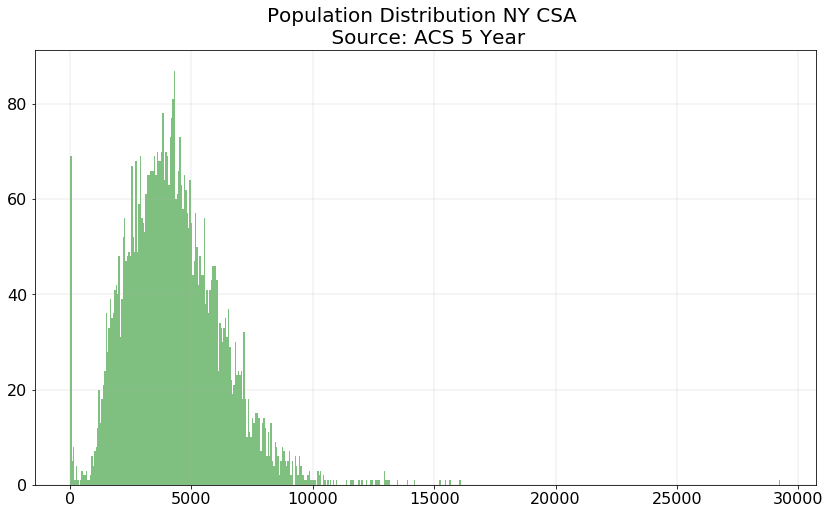

In [17]:
ax = plt.figure(figsize=(14,8)).add_subplot(111)
total_pop.hist('Total_Population', bins=500, color='g', alpha=0.5, ax=ax)
plt.grid(linewidth=0.25)
plt.title("Population Distribution NY CSA \n Source: ACS 5 Year", fontsize='20')
plt.xticks(fontsize='16')
plt.yticks(fontsize='16')
plt.show()

# Income 
### (Median Earnings) 

Sources: 
- https://api.census.gov/data/2016/acs/acs5/variables/B20002_001E.json
- https://api.census.gov/data/2016/acs/acs5/variables/B20002_002E.json
- https://api.census.gov/data/2016/acs/acs5/variables/B20002_003E.json

In [18]:
variable = 'B20002_001E'
word = 'Income'
gender = 'Total_'

income_total = censusDetailed(variable)
income_total.rename(columns={variable : gender + word}, inplace=True)
income_total.head(3)

(4918, 6)
(2010, 6)
(833, 6)
(3218, 6)
(5488, 7)


,NAME,Total_Income,state,county,tract,Unnamed: 5,stco
88,"Census Tract 1, Bronx County, New York",11347,36,5,100,NaN,365
89,"Census Tract 2, Bronx County, New York",35406,36,5,200,NaN,365
90,"Census Tract 4, Bronx County, New York",42492,36,5,400,NaN,365


In [19]:
variable = 'B20002_002E'
word = 'Income'
gender = 'Male_'

income_male = censusDetailed(variable)
income_male.rename(columns={variable : gender + word}, inplace=True)
income_male.head(3)

(4918, 6)
(2010, 6)
(833, 6)
(3218, 6)
(5488, 7)


,NAME,Male_Income,state,county,tract,Unnamed: 5,stco
88,"Census Tract 1, Bronx County, New York",11647,36,5,100,NaN,365
89,"Census Tract 2, Bronx County, New York",42008,36,5,200,NaN,365
90,"Census Tract 4, Bronx County, New York",42165,36,5,400,NaN,365


In [20]:
variable = 'B20002_003E'
word = 'Income'
gender = 'Female_'

income_female = censusDetailed(variable)
income_female.rename(columns={variable : gender + word}, inplace=True)
income_female.head(3)

(4918, 6)
(2010, 6)
(833, 6)
(3218, 6)
(5488, 7)


,NAME,Female_Income,state,county,tract,Unnamed: 5,stco
88,"Census Tract 1, Bronx County, New York",5221,36,5,100,NaN,365
89,"Census Tract 2, Bronx County, New York",31193,36,5,200,NaN,365
90,"Census Tract 4, Bronx County, New York",42933,36,5,400,NaN,365


In [21]:
income = income_total.merge(income_male[['Male_Income', 'NAME']], on='NAME')
income = income.merge(income_female[['Female_Income', 'NAME']], on='NAME')

# Cleaning up dataframe 
income.drop('Unnamed: 5', axis=1, inplace=True)
income = income[income > -1]
print(income.shape)
income.head()

(5488, 8)


,NAME,Total_Income,state,county,tract,stco,Male_Income,Female_Income
0,"Census Tract 1, Bronx County, New York",11347.0,36,5,100,365,11647.0,5221.0
1,"Census Tract 2, Bronx County, New York",35406.0,36,5,200,365,42008.0,31193.0
2,"Census Tract 4, Bronx County, New York",42492.0,36,5,400,365,42165.0,42933.0
3,"Census Tract 16, Bronx County, New York",22279.0,36,5,1600,365,22500.0,22042.0
4,"Census Tract 19, Bronx County, New York",31031.0,36,5,1900,365,31176.0,30870.0


In [22]:
print("Mean Income in NY CSA")
print("Total Population: $",int(income['Total_Income'].mean()))
print("Females: $",int(income['Female_Income'].mean()))
print("Males: $",int(income['Male_Income'].mean()))
print('---'*10)
print("Median Income in NY CSA")
print("Total Population: $",int(income['Total_Income'].median()))
print("Females: $",int(income['Female_Income'].median()))
print("Males: $",int(income['Male_Income'].median()))

Mean Income in NY CSA
Total Population: $ 41365
Females: $ 34659
Males: $ 49746
------------------------------
Median Income in NY CSA
Total Population: $ 38548
Females: $ 32594
Males: $ 43288


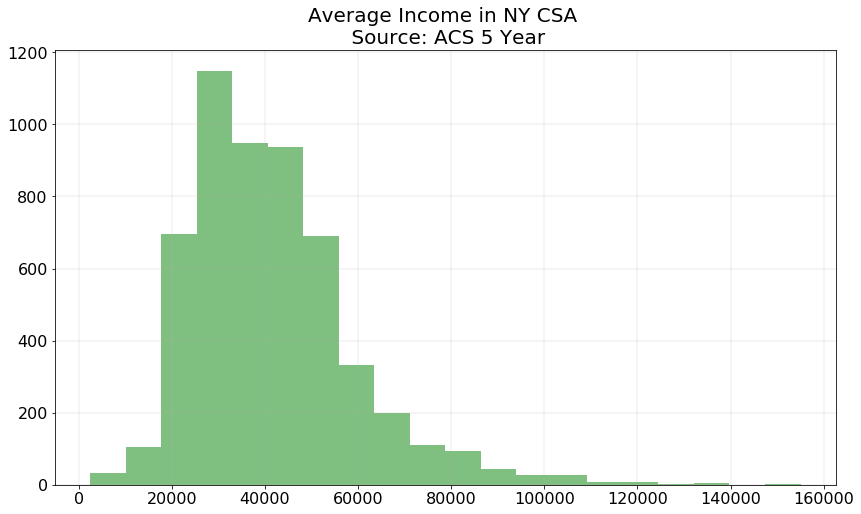

In [23]:
ax = plt.figure(figsize=(14,8)).add_subplot(111)
income.hist('Total_Income', bins=20, color='g', alpha=0.5, ax=ax)
#income.hist('Female_Income', bins=60, color='b', alpha=0.5, ax=ax)
#income.hist('Male_Income', bins=60, color='orange', alpha=0.5, ax=ax)
plt.grid(linewidth=0.25)
plt.title("Average Income in NY CSA \n Source: ACS 5 Year", fontsize='20')
plt.xticks(fontsize='16')
plt.yticks(fontsize='16')
plt.show()

**Fig ** Income is fairly normally distributed, with a long tail towards $160K. 

In [24]:
income.dropna(inplace=True)
income['Difference'] = income['Male_Income'] - income['Female_Income']
print(income['Difference'].mean())
income['Diff_cut'] = pd.qcut(income['Difference'], 4, labels=[1,2,3,4]) #labels=["Skewed to Women", "Fairly Equal", "Skewed to Men", "Very Skewed to Men"])
print(income['Diff_cut'].value_counts())
print(income.shape)
income.head()

15147.72337250513
1    1341
4    1340
3    1340
2    1340
Name: Diff_cut, dtype: int64
(5361, 10)


,NAME,Total_Income,state,county,tract,stco,Male_Income,Female_Income,Difference,Diff_cut
0,"Census Tract 1, Bronx County, New York",11347.0,36,5,100,365,11647.0,5221.0,6426.0,2
1,"Census Tract 2, Bronx County, New York",35406.0,36,5,200,365,42008.0,31193.0,10815.0,3
2,"Census Tract 4, Bronx County, New York",42492.0,36,5,400,365,42165.0,42933.0,-768.0,1
3,"Census Tract 16, Bronx County, New York",22279.0,36,5,1600,365,22500.0,22042.0,458.0,1
4,"Census Tract 19, Bronx County, New York",31031.0,36,5,1900,365,31176.0,30870.0,306.0,1


In [25]:
# Creating GEOID for merging
income['county'] = '00' + income['county'].astype(str)
income['county'] = income['county'].str[-3:]
income['state'] = income['state'].astype(str)
income['state'] = income['state'].str.replace('9', '09')
income['tract'] = '000' + income['tract'].astype(str)
income['tract'] = income['tract'].str[-6:]
income['GEOID'] = income['state'].astype(str) + income['county'].astype(str) + income['tract'].astype(str)
print(income.shape)
income.head()

(5361, 11)


,NAME,Total_Income,state,county,tract,stco,Male_Income,Female_Income,Difference,Diff_cut,GEOID
0,"Census Tract 1, Bronx County, New York",11347.0,36,005,000100,365,11647.0,5221.0,6426.0,2,36005000100
1,"Census Tract 2, Bronx County, New York",35406.0,36,005,000200,365,42008.0,31193.0,10815.0,3,36005000200
2,"Census Tract 4, Bronx County, New York",42492.0,36,005,000400,365,42165.0,42933.0,-768.0,1,36005000400
3,"Census Tract 16, Bronx County, New York",22279.0,36,005,001600,365,22500.0,22042.0,458.0,1,36005001600
4,"Census Tract 19, Bronx County, New York",31031.0,36,005,001900,365,31176.0,30870.0,306.0,1,36005001900


In [26]:
income_geo = shpfile.merge(income, on='GEOID')
income_geo.shape

ValueError: Buffer dtype mismatch, expected 'Python object' but got 'long'

Exception ignored in: 'pandas._libs.lib.is_bool_array'
ValueError: Buffer dtype mismatch, expected 'Python object' but got 'long'


(5361, 20)

### Mapping Gender Difference in Income per Tract

Text(0.5,1,'')

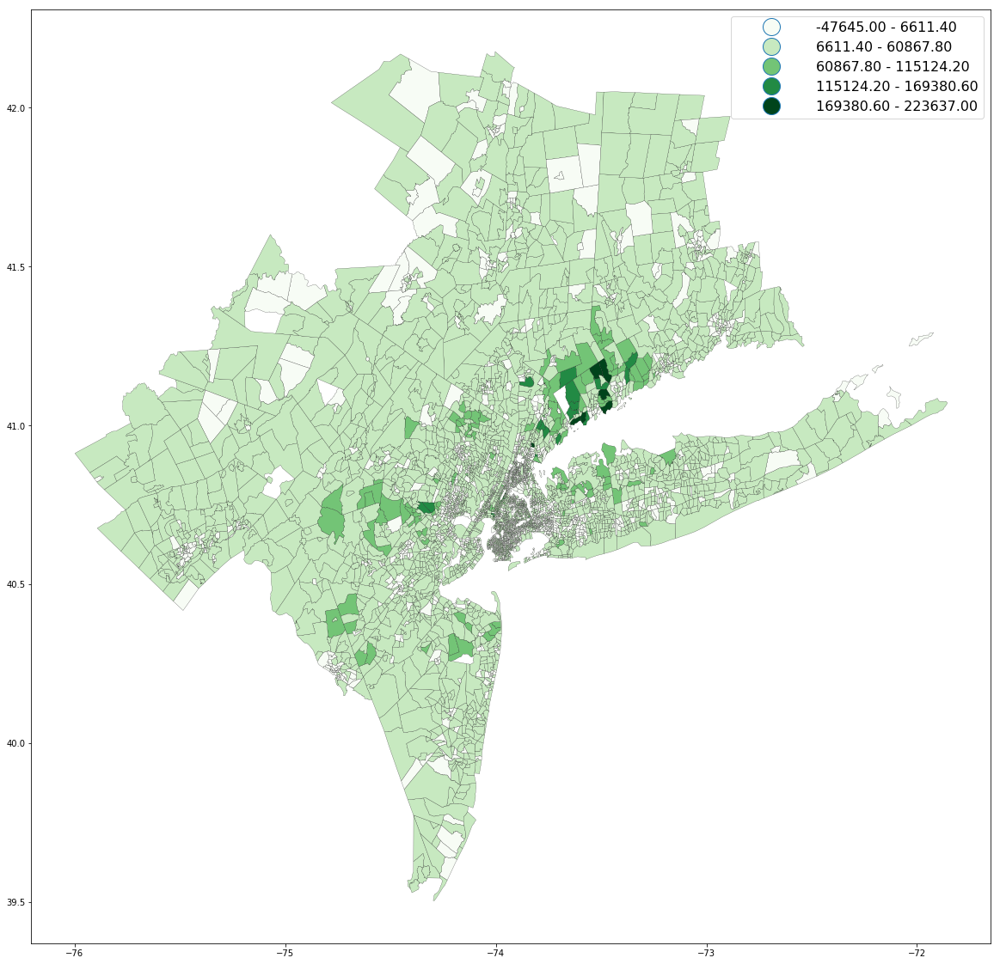

In [27]:
fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111)
income_geo.plot(column='Difference', ax=ax, cmap='Greens', scheme='equal_interval', k=5, edgecolor='k', linewidth=0.2, legend=True)
plt.title("", fontsize='20')

In [28]:
# Creating data just on New York City 
# Hashed out code for New Jersey 
nycbd = ["061", "047", "081", "085", "005"] #'017' '003'] Hudson & Bergen NJ counties 
states_ny = ['36'] #'34']
income_geo_nyc = income_geo[income_geo['STATEFP'].isin(states_ny)]
income_geo_nyc = income_geo_nyc[income_geo_nyc['COUNTYFP'].isin(nycbd)]
income_geo_nyc['COUNTYFP'].value_counts()

047    743
081    636
005    326
061    276
085    107
Name: COUNTYFP, dtype: int64

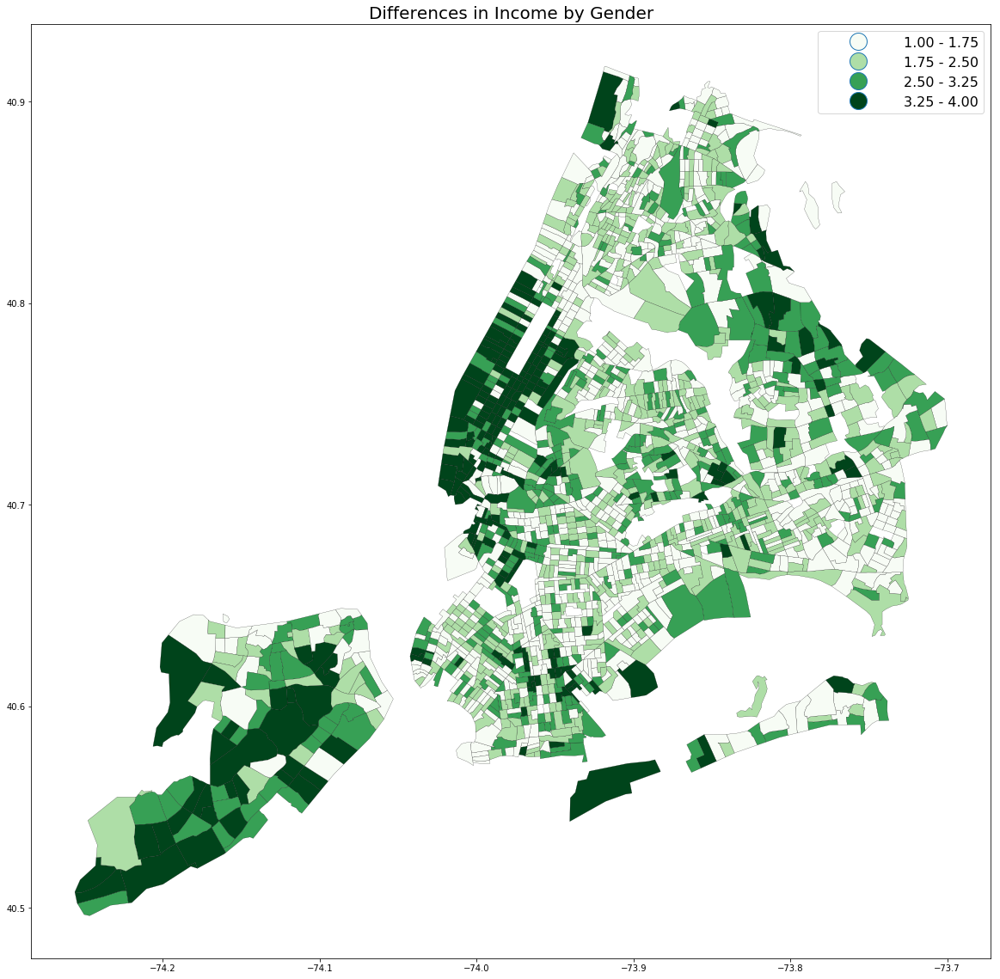

In [29]:
fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111)
income_geo_nyc.plot(column='Diff_cut', ax=ax, cmap='Greens', scheme='equal_interval', k=4, edgecolor='k', linewidth=0.2, legend=True)
plt.title("Differences in Income by Gender", fontsize='20')
savefig("incomedifferencesnyc.png")

- 1="Skewed to Women" 
- 2="Fairly Equal" 
- 3="Skewed to Men" 
- 4="Very Skewed to Men"])

# Housing Costs

Source: https://api.census.gov/data/2016/acs/acs5/variables/B25088_001E.json

In [30]:
variable = 'B25088_001E'
word = "Housing"
gender = 'Total_'

housing_total = pd.DataFrame()
for state in states:
    url = "https://api.census.gov/data/2016/acs/acs5?get=NAME," + variable +\
          "&for=tract:*&in=state:" + state + "&key=" + myAPI
    resp = requests.request('GET', url)
    aff1y = json.loads(resp.text)
    resp = requests.request('GET', url).content
    temp_df = pd.read_csv(io.StringIO(resp.decode('utf-8').replace('[','').replace(']','')))
    print(temp_df.shape)
    housing_total = housing_total.append(temp_df)

print(housing_total.shape) 
housing_total['stct'] = housing_total['state'].astype(str) + housing_total['county'].astype(str)
housing_total = housing_total[housing_total['stct'].isin(counties)]
housing_total = housing_total.rename(columns={variable : gender + word})
housing_total.drop('Unnamed: 5', axis=1, inplace=True)
housing_total.replace(-666666666, np.nan, inplace=True)
print(housing_total['stct'].nunique())
housing_total.head()

(4918, 6)
(2010, 6)
(833, 6)
(3218, 6)
(10979, 6)
35


,NAME,Total_Housing,state,county,tract,stct
88,"Census Tract 1, Bronx County, New York",NaN,36,5,100,365
89,"Census Tract 2, Bronx County, New York",2285.0,36,5,200,365
90,"Census Tract 4, Bronx County, New York",2258.0,36,5,400,365
91,"Census Tract 16, Bronx County, New York",2159.0,36,5,1600,365
92,"Census Tract 19, Bronx County, New York",1167.0,36,5,1900,365


In [31]:
print("Mean Housing Costs in NY CSA")
print("Total Population: $",int(housing_total['Total_Housing'].mean()))
print('---'*10)
print("Median Housing Costs in NY CSA")
print("Total Population: $",int(housing_total['Total_Housing'].median()))

Mean Housing Costs in NY CSA
Total Population: $ 1971
------------------------------
Median Housing Costs in NY CSA
Total Population: $ 1961


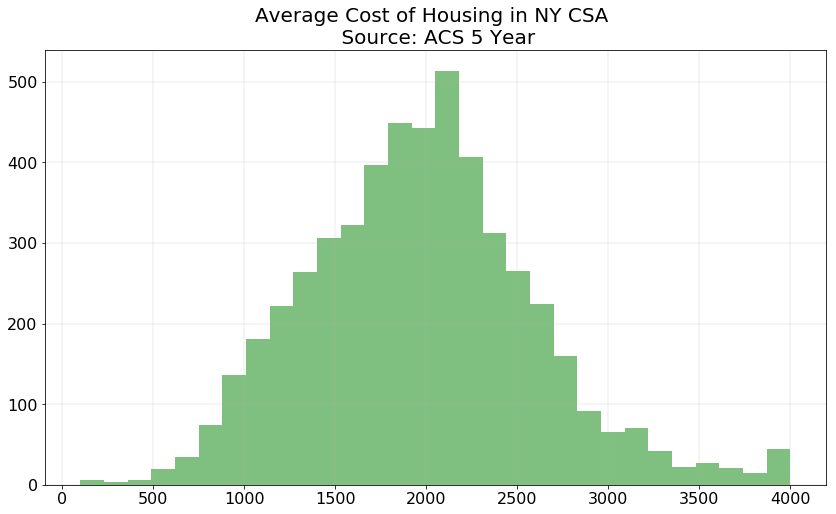

In [32]:
ax = plt.figure(figsize=(14,8)).add_subplot(111)
housing_total.hist('Total_Housing', bins=30, color='g', alpha=0.5, ax=ax)
plt.grid(linewidth=0.25)
plt.title("Average Cost of Housing in NY CSA \n Source: ACS 5 Year", fontsize='20')
plt.xticks(fontsize='16')
plt.yticks(fontsize='16')
plt.show()

**Fig ** Housing costs are fairly normally distributed, with a few peaks and a noticeable spike in the right tail. 

In [33]:
#Merging the two dataframes (income + housing)
financial = income.merge(housing_total[['NAME', 'Total_Housing']], on='NAME')
print(financial.shape)
financial.head()

ValueError: Buffer dtype mismatch, expected 'Python object' but got 'long'

(5361, 12)


Exception ignored in: 'pandas._libs.lib.is_bool_array'
ValueError: Buffer dtype mismatch, expected 'Python object' but got 'long'


,NAME,Total_Income,state,county,tract,stco,Male_Income,Female_Income,Difference,Diff_cut,GEOID,Total_Housing
0,"Census Tract 1, Bronx County, New York",11347.0,36,005,000100,365,11647.0,5221.0,6426.0,2,36005000100,NaN
1,"Census Tract 2, Bronx County, New York",35406.0,36,005,000200,365,42008.0,31193.0,10815.0,3,36005000200,2285.0
2,"Census Tract 4, Bronx County, New York",42492.0,36,005,000400,365,42165.0,42933.0,-768.0,1,36005000400,2258.0
3,"Census Tract 16, Bronx County, New York",22279.0,36,005,001600,365,22500.0,22042.0,458.0,1,36005001600,2159.0
4,"Census Tract 19, Bronx County, New York",31031.0,36,005,001900,365,31176.0,30870.0,306.0,1,36005001900,1167.0


# Commute Duration

Sources: 
- https://api.census.gov/data/2016/acs/acs5/subject/variables/S0801_C01_046E.json
- https://api.census.gov/data/2016/acs/acs5/subject/variables/S0801_C02_046E.json
- https://api.census.gov/data/2016/acs/acs5/subject/variables/S0801_C03_046E.json

(You'll notice that the only thing to change in the variable for each gender is C01 (total), C02 (male), C03 (female). This is consistent throughout the subject tables.)

In [34]:
variable = 'S0801_C01_046E'
word = "Time"
gender = 'Total_'

meanTT_total = pd.DataFrame()
for state in states:
    url = "https://api.census.gov/data/2016/acs/acs5/subject?get=NAME," + variable +\
          "&for=tract:*&in=state:" + state + "&key=" + myAPI
    resp = requests.request('GET', url)
    aff1y = json.loads(resp.text)
    resp = requests.request('GET', url).content
    temp_df = pd.read_csv(io.StringIO(resp.decode('utf-8').replace('[','').replace(']','')))
    print(temp_df.shape)
    meanTT_total = meanTT_total.append(temp_df)

print(meanTT_total.shape) 
meanTT_total['stct'] = meanTT_total['state'].astype(str) + meanTT_total['county'].astype(str)
meanTT_total = meanTT_total[meanTT_total['stct'].isin(counties)]
meanTT_total = meanTT_total.rename(columns={variable : gender + word})
meanTT_total.drop('Unnamed: 5', axis=1, inplace=True)
meanTT_total.replace(-666666666, np.nan, inplace=True)
print(meanTT_total['stct'].nunique())
meanTT_total.head()

(4918, 6)
(2010, 6)
(833, 6)
(3218, 6)
(10979, 6)
35


,NAME,Total_Time,state,county,tract,stct
88,"Census Tract 1, Bronx County, New York",NaN,36,5,100,365
89,"Census Tract 2, Bronx County, New York",44.0,36,5,200,365
90,"Census Tract 4, Bronx County, New York",48.4,36,5,400,365
91,"Census Tract 16, Bronx County, New York",35.8,36,5,1600,365
92,"Census Tract 19, Bronx County, New York",43.8,36,5,1900,365


In [35]:
variable = 'S0801_C02_046E'
word = "Time"
gender = 'Male_'

meanTT_m = pd.DataFrame()
for state in states:
    url = "https://api.census.gov/data/2016/acs/acs5/subject?get=NAME," + variable +\
          "&for=tract:*&in=state:" + state + "&key=" + myAPI
    resp = requests.request('GET', url)
    aff1y = json.loads(resp.text)
    resp = requests.request('GET', url).content
    temp_df = pd.read_csv(io.StringIO(resp.decode('utf-8').replace('[','').replace(']','')))
    print(temp_df.shape)
    meanTT_m = meanTT_m.append(temp_df)

print(meanTT_m.shape) 
meanTT_m['stct'] = meanTT_m['state'].astype(str) + meanTT_m['county'].astype(str)
meanTT_m = meanTT_m[meanTT_m['stct'].isin(counties)]
meanTT_m = meanTT_m.rename(columns={variable : gender + word})
meanTT_m.drop('Unnamed: 5', axis=1, inplace=True)
meanTT_m.replace(-666666666, np.nan, inplace=True)
print(meanTT_m['stct'].nunique())
meanTT_m.head()

(4918, 6)
(2010, 6)
(833, 6)
(3218, 6)
(10979, 6)
35


,NAME,Male_Time,state,county,tract,stct
88,"Census Tract 1, Bronx County, New York",NaN,36,5,100,365
89,"Census Tract 2, Bronx County, New York",42.7,36,5,200,365
90,"Census Tract 4, Bronx County, New York",45.3,36,5,400,365
91,"Census Tract 16, Bronx County, New York",32.9,36,5,1600,365
92,"Census Tract 19, Bronx County, New York",41.4,36,5,1900,365


In [36]:
variable = 'S0801_C03_046E'
word = "Time"
gender = 'Female_'

meanTT_f = pd.DataFrame()
for state in states:
    url = "https://api.census.gov/data/2016/acs/acs5/subject?get=NAME," + variable +\
          "&for=tract:*&in=state:" + state + "&key=" + myAPI
    resp = requests.request('GET', url)
    aff1y = json.loads(resp.text)
    resp = requests.request('GET', url).content
    temp_df = pd.read_csv(io.StringIO(resp.decode('utf-8').replace('[','').replace(']','')))
    print(temp_df.shape)
    meanTT_f = meanTT_f.append(temp_df)

print(meanTT_f.shape) 
meanTT_f['stct'] = meanTT_f['state'].astype(str) + meanTT_f['county'].astype(str)
meanTT_f = meanTT_f[meanTT_f['stct'].isin(counties)]
meanTT_f = meanTT_f.rename(columns={variable : gender + word})
meanTT_f.drop('Unnamed: 5', axis=1, inplace=True)
meanTT_f.replace(-666666666, np.nan, inplace=True)
print(meanTT_f['stct'].nunique())
meanTT_f.head()

(4918, 6)
(2010, 6)
(833, 6)
(3218, 6)
(10979, 6)
35


,NAME,Female_Time,state,county,tract,stct
88,"Census Tract 1, Bronx County, New York",NaN,36,5,100,365
89,"Census Tract 2, Bronx County, New York",45.7,36,5,200,365
90,"Census Tract 4, Bronx County, New York",52.0,36,5,400,365
91,"Census Tract 16, Bronx County, New York",38.4,36,5,1600,365
92,"Census Tract 19, Bronx County, New York",46.6,36,5,1900,365


In [37]:
meanTT = pd.merge(meanTT_total, meanTT_m[['NAME', 'Male_Time']])
meanTT = meanTT.merge(meanTT_f[['NAME', 'Female_Time']])
print(meanTT.shape)

# Getting rid of any negative values
meanTT = meanTT[meanTT['Total_Time'] >= 0]
print(meanTT.shape)
meanTT.head()

(5488, 8)
(5402, 8)


,NAME,Total_Time,state,county,tract,stct,Male_Time,Female_Time
1,"Census Tract 2, Bronx County, New York",44.0,36,5,200,365,42.7,45.7
2,"Census Tract 4, Bronx County, New York",48.4,36,5,400,365,45.3,52.0
3,"Census Tract 16, Bronx County, New York",35.8,36,5,1600,365,32.9,38.4
4,"Census Tract 19, Bronx County, New York",43.8,36,5,1900,365,41.4,46.6
5,"Census Tract 20, Bronx County, New York",44.2,36,5,2000,365,41.6,45.8


In [38]:
print("The overall mean travel time in the NY CSA is", int(meanTT['Total_Time'].mean()), "minutes.")
print("The mean travel time for males in the NY CSA is", int(meanTT['Male_Time'].mean()), "minutes.")
print("The mean travel time for femals in the NY CSA is", int(meanTT['Female_Time'].mean()), "minutes.")

The overall mean travel time in the NY CSA is 35 minutes.
The mean travel time for males in the NY CSA is 36 minutes.
The mean travel time for femals in the NY CSA is 33 minutes.


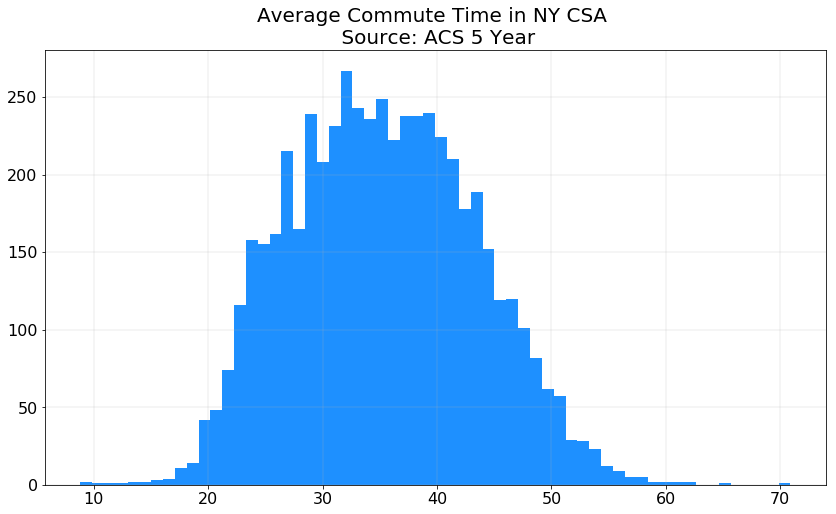

In [39]:
#fig = plt.figure(figsize=(12,8))
ax = plt.figure(figsize=(14,8)).add_subplot(111)
meanTT.hist('Total_Time', bins=60, color='dodgerblue', ax=ax)
#meanTT.hist('Female_Time', bins=60, color='g', alpha=0.5, ax=ax)
#meanTT.hist('Female_Time', bins=60, color='orange', alpha=0.5, ax=ax)
plt.grid(linewidth=0.25)
plt.title("Average Commute Time in NY CSA \n Source: ACS 5 Year", fontsize='20')
plt.xticks(fontsize='16')
plt.yticks(fontsize='16')
plt.show()
#savefig("avgcommutetime.png")

**Fig ** Mean travel time for all population in NY CSA region. It is fairly normally distributed. 

# Commute Modes

The Census uses 6 commute modes: 
- Car
- Public Transit 
- Bicycle
- Walk 
- Other (Taxi, ferry, motorcylce) 
- Worked from home

For this analysis, we are just looking at car and public transit, since they account for a majority of trips. 

## Cars
Sources: 

- Total: https://api.census.gov/data/2016/acs/acs5/subject/variables/S0801_C01_002E.json
- Male: https://api.census.gov/data/2016/acs/acs5/subject/variables/S0801_C02_002E.json
- Female: https://api.census.gov/data/2016/acs/acs5/subject/variables/S0801_C03_002E.json

In [40]:
variable = 'S0801_C01_002E'
word = "Car"
gender = 'Total_'

mode_car_total = pd.DataFrame()
for state in states:
    url = "https://api.census.gov/data/2016/acs/acs5/subject?get=NAME," + variable +\
          "&for=tract:*&in=state:" + state + "&key=" + myAPI
    resp = requests.request('GET', url)
    aff1y = json.loads(resp.text)
    resp = requests.request('GET', url).content
    temp_df = pd.read_csv(io.StringIO(resp.decode('utf-8').replace('[','').replace(']','')))
    print(temp_df.shape)
    mode_car_total = mode_car_total.append(temp_df)

print(mode_car_total.shape) 
mode_car_total['stct'] = mode_car_total['state'].astype(str) + mode_car_total['county'].astype(str)
mode_car_total = mode_car_total[mode_car_total['stct'].isin(counties)]
mode_car_total = mode_car_total.rename(columns={variable : gender + word})
mode_car_total.drop('Unnamed: 5', axis=1, inplace=True)
mode_car_total.replace(-666666666, np.nan, inplace=True)
print(mode_car_total['stct'].nunique())
mode_car_total.head()

(4918, 6)
(2010, 6)
(833, 6)
(3218, 6)
(10979, 6)
35


,NAME,Total_Car,state,county,tract,stct
88,"Census Tract 1, Bronx County, New York",NaN,36,5,100,365
89,"Census Tract 2, Bronx County, New York",57.1,36,5,200,365
90,"Census Tract 4, Bronx County, New York",48.7,36,5,400,365
91,"Census Tract 16, Bronx County, New York",44.6,36,5,1600,365
92,"Census Tract 19, Bronx County, New York",23.8,36,5,1900,365


In [41]:
variable = 'S0801_C02_002E'
word = "Car"
gender = 'Male_'

mode_car_m = pd.DataFrame()
for state in states:
    url = "https://api.census.gov/data/2016/acs/acs5/subject?get=NAME," + variable +\
          "&for=tract:*&in=state:" + state + "&key=" + myAPI
    resp = requests.request('GET', url)
    aff1y = json.loads(resp.text)
    resp = requests.request('GET', url).content
    temp_df = pd.read_csv(io.StringIO(resp.decode('utf-8').replace('[','').replace(']','')))
    print(temp_df.shape)
    mode_car_m = mode_car_m.append(temp_df)

print(mode_car_m.shape) 
mode_car_m['stct'] = mode_car_m['state'].astype(str) + mode_car_m['county'].astype(str)
mode_car_m = mode_car_m[mode_car_m['stct'].isin(counties)]
mode_car_m = mode_car_m.rename(columns={variable : gender + word})
mode_car_m.drop('Unnamed: 5', axis=1, inplace=True)
mode_car_m.replace(-666666666, np.nan, inplace=True)
print(mode_car_m['stct'].nunique())
mode_car_m.head()

(4918, 6)
(2010, 6)
(833, 6)
(3218, 6)
(10979, 6)
35


,NAME,Male_Car,state,county,tract,stct
88,"Census Tract 1, Bronx County, New York",NaN,36,5,100,365
89,"Census Tract 2, Bronx County, New York",58.5,36,5,200,365
90,"Census Tract 4, Bronx County, New York",51.6,36,5,400,365
91,"Census Tract 16, Bronx County, New York",59.8,36,5,1600,365
92,"Census Tract 19, Bronx County, New York",25.9,36,5,1900,365


In [42]:
variable = 'S0801_C03_002E'
word = "Car"
gender = 'Female_'

mode_car_f = pd.DataFrame()
for state in states:
    url = "https://api.census.gov/data/2016/acs/acs5/subject?get=NAME," + variable +\
          "&for=tract:*&in=state:" + state + "&key=" + myAPI
    resp = requests.request('GET', url)
    aff1y = json.loads(resp.text)
    resp = requests.request('GET', url).content
    temp_df = pd.read_csv(io.StringIO(resp.decode('utf-8').replace('[','').replace(']','')))
    print(temp_df.shape)
    mode_car_f = mode_car_f.append(temp_df)

print(mode_car_f.shape) 
mode_car_f['stct'] = mode_car_f['state'].astype(str) + mode_car_f['county'].astype(str)
mode_car_f = mode_car_f[mode_car_f['stct'].isin(counties)]
mode_car_f = mode_car_f.rename(columns={variable : gender + word})
mode_car_f.drop('Unnamed: 5', axis=1, inplace=True)
mode_car_f.replace(-666666666, np.nan, inplace=True)
print(mode_car_f['stct'].nunique())
mode_car_f.head()

(4918, 6)
(2010, 6)
(833, 6)
(3218, 6)
(10979, 6)
35


,NAME,Female_Car,state,county,tract,stct
88,"Census Tract 1, Bronx County, New York",NaN,36,5,100,365
89,"Census Tract 2, Bronx County, New York",55.4,36,5,200,365
90,"Census Tract 4, Bronx County, New York",45.1,36,5,400,365
91,"Census Tract 16, Bronx County, New York",31.0,36,5,1600,365
92,"Census Tract 19, Bronx County, New York",21.4,36,5,1900,365


In [43]:
mode_car = pd.merge(mode_car_total, mode_car_m[['NAME', 'Male_Car']], on='NAME')
mode_car = mode_car.merge(mode_car_f[['NAME', 'Female_Car']], on='NAME')
mode_car.head()

,NAME,Total_Car,state,county,tract,stct,Male_Car,Female_Car
0,"Census Tract 1, Bronx County, New York",NaN,36,5,100,365,NaN,NaN
1,"Census Tract 2, Bronx County, New York",57.1,36,5,200,365,58.5,55.4
2,"Census Tract 4, Bronx County, New York",48.7,36,5,400,365,51.6,45.1
3,"Census Tract 16, Bronx County, New York",44.6,36,5,1600,365,59.8,31.0
4,"Census Tract 19, Bronx County, New York",23.8,36,5,1900,365,25.9,21.4


In [44]:
print("On average", int(mode_car['Total_Car'].mean()), "percent of people commute via car in the New York CSA.")
print("On average", int(mode_car['Female_Car'].mean()), "percent of females commute via car in the New York CSA.")
print("On average", int(mode_car['Male_Car'].mean()), "percent of males commute via car in the New York CSA.")

On average 59 percent of people commute via car in the New York CSA.
On average 58 percent of females commute via car in the New York CSA.
On average 61 percent of males commute via car in the New York CSA.


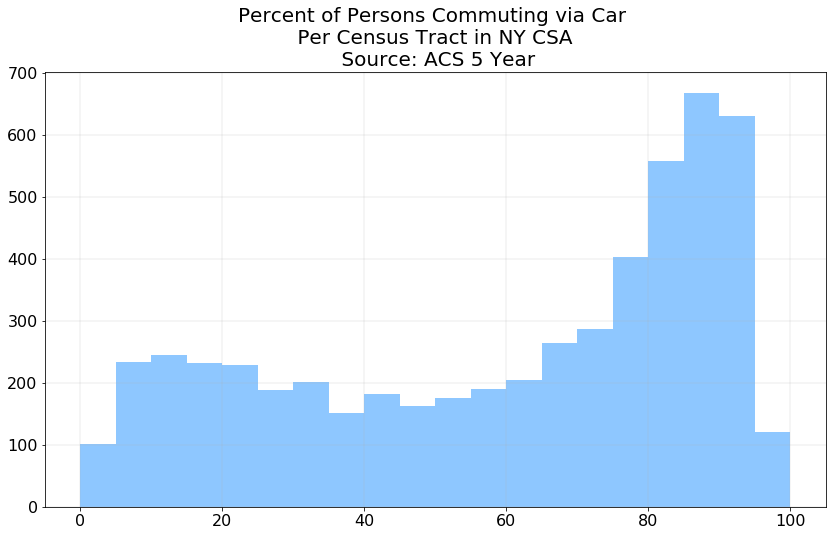

In [45]:
ax = plt.figure(figsize=(14,8)).add_subplot(111)
mode_car.hist('Total_Car', bins=20, color='dodgerblue', alpha=0.5, ax=ax)
#mode_car.hist('Female_Car', bins=60, color='b', alpha=0.5, ax=ax)
#mode_car.hist('Male_Car', bins=60, color='orange', alpha=0.5, ax=ax)
plt.grid(linewidth=0.25)
plt.title("Percent of Persons Commuting via Car \n Per Census Tract in NY CSA \n Source: ACS 5 Year", fontsize='20')
plt.xticks(fontsize='16')
plt.yticks(fontsize='16')
plt.show()

**Fig ** It can be seen that the distribution is skewed to the right, and that commutingn via car is overall the most common method in the entire NY CSA. These histogram would likely look different if you just considered New York City. 

## Public Transit

Sources: 

- Total: https://api.census.gov/data/2016/acs/acs5/subject/variables/S0801_C01_009E.json
- Male: https://api.census.gov/data/2016/acs/acs5/subject/variables/S0801_C02_009E.json
- Female: https://api.census.gov/data/2016/acs/acs5/subject/variables/S0801_C03_009E.json

In [46]:
variable = 'S0801_C01_009E'
word = "Public"
gender = 'Total_'

mode_public_total = pd.DataFrame()
for state in states:
    url = "https://api.census.gov/data/2016/acs/acs5/subject?get=NAME," + variable +\
          "&for=tract:*&in=state:" + state + "&key=" + myAPI
    resp = requests.request('GET', url)
    aff1y = json.loads(resp.text)
    resp = requests.request('GET', url).content
    temp_df = pd.read_csv(io.StringIO(resp.decode('utf-8').replace('[','').replace(']','')))
    print(temp_df.shape)
    mode_public_total = mode_public_total.append(temp_df)

print(mode_public_total.shape) 
mode_public_total['stct'] = mode_public_total['state'].astype(str) + mode_public_total['county'].astype(str)
mode_public_total = mode_public_total[mode_public_total['stct'].isin(counties)]
mode_public_total = mode_public_total.rename(columns={variable : gender + word})
mode_public_total.drop('Unnamed: 5', axis=1, inplace=True)
mode_public_total.replace(-666666666, np.nan, inplace=True)
print(mode_public_total['stct'].nunique())
mode_public_total.head()

(4918, 6)
(2010, 6)
(833, 6)
(3218, 6)
(10979, 6)
35


,NAME,Total_Public,state,county,tract,stct
88,"Census Tract 1, Bronx County, New York",NaN,36,5,100,365
89,"Census Tract 2, Bronx County, New York",39.2,36,5,200,365
90,"Census Tract 4, Bronx County, New York",47.3,36,5,400,365
91,"Census Tract 16, Bronx County, New York",44.1,36,5,1600,365
92,"Census Tract 19, Bronx County, New York",64.0,36,5,1900,365


In [47]:
variable = 'S0801_C02_009E'
word = "Public"
gender = 'Male_'

mode_public_m = pd.DataFrame()
for state in states:
    url = "https://api.census.gov/data/2016/acs/acs5/subject?get=NAME," + variable +\
          "&for=tract:*&in=state:" + state + "&key=" + myAPI
    resp = requests.request('GET', url)
    aff1y = json.loads(resp.text)
    resp = requests.request('GET', url).content
    temp_df = pd.read_csv(io.StringIO(resp.decode('utf-8').replace('[','').replace(']','')))
    print(temp_df.shape)
    mode_public_m = mode_public_m.append(temp_df)

print(mode_public_m.shape) 
mode_public_m['stct'] = mode_public_m['state'].astype(str) + mode_public_m['county'].astype(str)
mode_public_m = mode_public_m[mode_public_m['stct'].isin(counties)]
mode_public_m = mode_public_m.rename(columns={variable : gender + word})
mode_public_m.drop('Unnamed: 5', axis=1, inplace=True)
mode_public_m.replace(-666666666, np.nan, inplace=True)
print(mode_public_m['stct'].nunique())
mode_public_m.head()

(4918, 6)
(2010, 6)
(833, 6)
(3218, 6)
(10979, 6)
35


,NAME,Male_Public,state,county,tract,stct
88,"Census Tract 1, Bronx County, New York",NaN,36,5,100,365
89,"Census Tract 2, Bronx County, New York",35.0,36,5,200,365
90,"Census Tract 4, Bronx County, New York",44.1,36,5,400,365
91,"Census Tract 16, Bronx County, New York",33.5,36,5,1600,365
92,"Census Tract 19, Bronx County, New York",61.5,36,5,1900,365


In [48]:
variable = 'S0801_C03_009E'
word = "Public"
gender = 'Female_'

mode_public_f = pd.DataFrame()
for state in states:
    url = "https://api.census.gov/data/2016/acs/acs5/subject?get=NAME," + variable +\
          "&for=tract:*&in=state:" + state + "&key=" + myAPI
    resp = requests.request('GET', url)
    aff1y = json.loads(resp.text)
    resp = requests.request('GET', url).content
    temp_df = pd.read_csv(io.StringIO(resp.decode('utf-8').replace('[','').replace(']','')))
    print(temp_df.shape)
    mode_public_f = mode_public_f.append(temp_df)

print(mode_public_f.shape) 
mode_public_f['stct'] = mode_public_f['state'].astype(str) + mode_public_f['county'].astype(str)
mode_public_f = mode_public_f[mode_public_f['stct'].isin(counties)]
mode_public_f = mode_public_f.rename(columns={variable : gender + word})
mode_public_f.drop('Unnamed: 5', axis=1, inplace=True)
mode_public_f.replace(-666666666, np.nan, inplace=True)
print(mode_public_f['stct'].nunique())
mode_public_f.head()

(4918, 6)
(2010, 6)
(833, 6)
(3218, 6)
(10979, 6)
35


,NAME,Female_Public,state,county,tract,stct
88,"Census Tract 1, Bronx County, New York",NaN,36,5,100,365
89,"Census Tract 2, Bronx County, New York",44.6,36,5,200,365
90,"Census Tract 4, Bronx County, New York",51.2,36,5,400,365
91,"Census Tract 16, Bronx County, New York",53.7,36,5,1600,365
92,"Census Tract 19, Bronx County, New York",66.9,36,5,1900,365


In [49]:
mode_public = pd.merge(mode_public_total, mode_public_m[['NAME', 'Male_Public']], on='NAME')
mode_public = mode_public.merge(mode_public_f[['NAME', 'Female_Public']], on='NAME')
mode_public.head()

,NAME,Total_Public,state,county,tract,stct,Male_Public,Female_Public
0,"Census Tract 1, Bronx County, New York",NaN,36,5,100,365,NaN,NaN
1,"Census Tract 2, Bronx County, New York",39.2,36,5,200,365,35.0,44.6
2,"Census Tract 4, Bronx County, New York",47.3,36,5,400,365,44.1,51.2
3,"Census Tract 16, Bronx County, New York",44.1,36,5,1600,365,33.5,53.7
4,"Census Tract 19, Bronx County, New York",64.0,36,5,1900,365,61.5,66.9


In [50]:
print("On average", int(mode_public['Total_Public'].mean()), "percent of people commute via public transit in the New York CSA.")
print("On average", int(mode_public['Female_Public'].mean()), "percent of females commute via public transit in the New York CSA.")
print("On average", int(mode_public['Male_Public'].mean()), "percent of males commute via public transit in the New York CSA.")

On average 28 percent of people commute via public transit in the New York CSA.
On average 29 percent of females commute via public transit in the New York CSA.
On average 27 percent of males commute via public transit in the New York CSA.


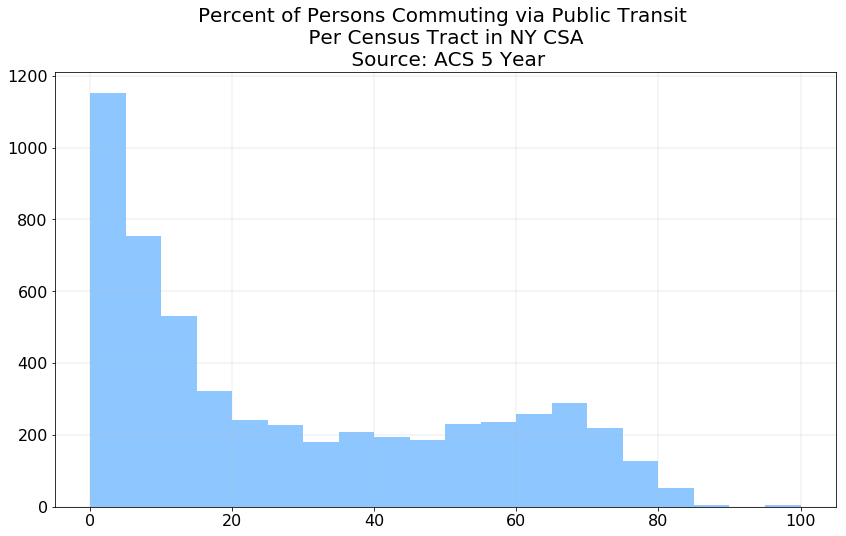

In [51]:
ax = plt.figure(figsize=(14,8)).add_subplot(111)
mode_public.hist('Total_Public', bins=20, color='dodgerblue', alpha=0.5, ax=ax)
#mode_public.hist('Female_Public', bins=20, color='g', alpha=0.5, ax=ax)
#mode_public.hist('Male_Public', bins=20, color='r', alpha=0.5, ax=ax)
plt.grid(linewidth=0.25)
plt.title("Percent of Persons Commuting via Public Transit \n Per Census Tract in NY CSA \n Source: ACS 5 Year", fontsize='20')
plt.xticks(fontsize='16')
plt.yticks(fontsize='16')
plt.show()

**Fig ** Commuting via public transit is not common in quite a few census tracts. Again, this would probably like quite different if you just considered New York City. 

In [52]:
modes = pd.merge(mode_car, mode_public[['Total_Public', 'Male_Public', 'Female_Public', 'NAME']], on='NAME')
modes.dropna(inplace=True)
print(modes.shape)
modes.head()

(5416, 11)


,NAME,Total_Car,state,county,tract,stct,Male_Car,Female_Car,Total_Public,Male_Public,Female_Public
1,"Census Tract 2, Bronx County, New York",57.1,36,5,200,365,58.5,55.4,39.2,35.0,44.6
2,"Census Tract 4, Bronx County, New York",48.7,36,5,400,365,51.6,45.1,47.3,44.1,51.2
3,"Census Tract 16, Bronx County, New York",44.6,36,5,1600,365,59.8,31.0,44.1,33.5,53.7
4,"Census Tract 19, Bronx County, New York",23.8,36,5,1900,365,25.9,21.4,64.0,61.5,66.9
5,"Census Tract 20, Bronx County, New York",25.3,36,5,2000,365,38.3,16.7,67.3,55.1,75.3


In [53]:
# Creating GEOID for merging
modes['county'] = '00' + modes['county'].astype(str)
modes['county'] = modes['county'].str[-3:]
modes['state'] = modes['state'].astype(str)
modes['state'] = modes['state'].str.replace('9', '09')
modes['tract'] = '000' + modes['tract'].astype(str)
modes['tract'] = modes['tract'].str[-6:]
modes['GEOID'] = modes['state'].astype(str) + modes['county'].astype(str) + modes['tract'].astype(str)
print(modes.shape)
modes.head()

(5416, 12)


,NAME,Total_Car,state,county,tract,stct,Male_Car,Female_Car,Total_Public,Male_Public,Female_Public,GEOID
1,"Census Tract 2, Bronx County, New York",57.1,36,005,000200,365,58.5,55.4,39.2,35.0,44.6,36005000200
2,"Census Tract 4, Bronx County, New York",48.7,36,005,000400,365,51.6,45.1,47.3,44.1,51.2,36005000400
3,"Census Tract 16, Bronx County, New York",44.6,36,005,001600,365,59.8,31.0,44.1,33.5,53.7,36005001600
4,"Census Tract 19, Bronx County, New York",23.8,36,005,001900,365,25.9,21.4,64.0,61.5,66.9,36005001900
5,"Census Tract 20, Bronx County, New York",25.3,36,005,002000,365,38.3,16.7,67.3,55.1,75.3,36005002000


## Mean Travel Time per Mode


**Public Transit**
Source: https://api.census.gov/data/2016/acs/acs5/subject/variables/S0802_C04_090E.json

In [54]:
variable = 'S0802_C04_090E'
word = "PublicTime"
gender = 'Total_'

time_public = pd.DataFrame()
for state in states:
    url = "https://api.census.gov/data/2016/acs/acs5/subject?get=NAME," + variable +\
          "&for=tract:*&in=state:" + state + "&key=" + myAPI
    resp = requests.request('GET', url)
    aff1y = json.loads(resp.text)
    resp = requests.request('GET', url).content
    temp_df = pd.read_csv(io.StringIO(resp.decode('utf-8').replace('[','').replace(']','')))
    print(temp_df.shape)
    time_public = time_public.append(temp_df)

print(time_public.shape) 
time_public['stct'] = time_public['state'].astype(str) + time_public['county'].astype(str)
time_public = time_public[time_public['stct'].isin(counties)]
time_public = time_public.rename(columns={variable : gender + word})
time_public.drop('Unnamed: 5', axis=1, inplace=True)
time_public.replace([-999999999, -666666666], np.nan, inplace=True)
#time_public = time_public[time_public['Total_PublicTime'] >= 0]
print(time_public['stct'].nunique())
time_public.head()

(4918, 6)
(2010, 6)
(833, 6)
(3218, 6)
(10979, 6)
35


,NAME,Total_PublicTime,state,county,tract,stct
88,"Census Tract 1, Bronx County, New York",NaN,36,5,100,365
89,"Census Tract 2, Bronx County, New York",67.5,36,5,200,365
90,"Census Tract 4, Bronx County, New York",NaN,36,5,400,365
91,"Census Tract 16, Bronx County, New York",NaN,36,5,1600,365
92,"Census Tract 19, Bronx County, New York",53.1,36,5,1900,365


**Car** 

Source: https://api.census.gov/data/2016/acs/acs5/subject/variables/S0802_C02_090E.json

In [55]:
variable = 'S0802_C02_090E'
word = "CarTime"
gender = 'Total_'

time_car = pd.DataFrame()
for state in states:
    url = "https://api.census.gov/data/2016/acs/acs5/subject?get=NAME," + variable +\
          "&for=tract:*&in=state:" + state + "&key=" + myAPI
    resp = requests.request('GET', url)
    aff1y = json.loads(resp.text)
    resp = requests.request('GET', url).content
    temp_df = pd.read_csv(io.StringIO(resp.decode('utf-8').replace('[','').replace(']','')))
    print(temp_df.shape)
    time_car = time_car.append(temp_df)

print(time_car.shape) 
time_car['stct'] = time_car['state'].astype(str) + time_car['county'].astype(str)
time_car = time_car[time_car['stct'].isin(counties)]
time_car = time_car.rename(columns={variable : gender + word})
time_car.drop('Unnamed: 5', axis=1, inplace=True)
time_car.replace([-999999999, -666666666], np.nan, inplace=True)
print(time_car['stct'].nunique())
print(time_car.shape)
time_car.head()

(4918, 6)
(2010, 6)
(833, 6)
(3218, 6)
(10979, 6)
35
(5488, 6)


,NAME,Total_CarTime,state,county,tract,stct
88,"Census Tract 1, Bronx County, New York",NaN,36,5,100,365
89,"Census Tract 2, Bronx County, New York",27.3,36,5,200,365
90,"Census Tract 4, Bronx County, New York",NaN,36,5,400,365
91,"Census Tract 16, Bronx County, New York",NaN,36,5,1600,365
92,"Census Tract 19, Bronx County, New York",25.1,36,5,1900,365


In [56]:
modes = modes.merge(time_public[['NAME', 'Total_PublicTime']], on='NAME')
modes = modes.merge(time_car[['NAME', 'Total_CarTime']], on='NAME')
print(modes.shape)
modes.head()

(5416, 14)


,NAME,Total_Car,state,county,tract,stct,Male_Car,Female_Car,Total_Public,Male_Public,Female_Public,GEOID,Total_PublicTime,Total_CarTime
0,"Census Tract 2, Bronx County, New York",57.1,36,005,000200,365,58.5,55.4,39.2,35.0,44.6,36005000200,67.5,27.3
1,"Census Tract 4, Bronx County, New York",48.7,36,005,000400,365,51.6,45.1,47.3,44.1,51.2,36005000400,NaN,NaN
2,"Census Tract 16, Bronx County, New York",44.6,36,005,001600,365,59.8,31.0,44.1,33.5,53.7,36005001600,NaN,NaN
3,"Census Tract 19, Bronx County, New York",23.8,36,005,001900,365,25.9,21.4,64.0,61.5,66.9,36005001900,53.1,25.1
4,"Census Tract 20, Bronx County, New York",25.3,36,005,002000,365,38.3,16.7,67.3,55.1,75.3,36005002000,NaN,NaN


In [57]:
print("The average car commuting time in the NY CSA is", int(time_car['Total_CarTime'].mean()), "minutes")
print("The average public transit commuting time in the NY CSA is", int(time_public['Total_PublicTime'].mean()), "minutes")

The average car commuting time in the NY CSA is 29 minutes
The average public transit commuting time in the NY CSA is 56 minutes


# Single Dataframe

In [58]:
df = modes.merge(financial[['Total_Housing', 'Total_Income', 'Female_Income', 'Male_Income', 'NAME']], on='NAME')
df = df.merge(meanTT[['NAME', 'Total_Time', 'Female_Time', 'Male_Time']], on='NAME')
df = df.merge(total_pop[['Total_Population', 'NAME']], on='NAME')
print(df.shape)
print('Columns:', list(df.columns))
df.head()

(5358, 22)
Columns: ['NAME', 'Total_Car', 'state', 'county', 'tract', 'stct', 'Male_Car', 'Female_Car', 'Total_Public', 'Male_Public', 'Female_Public', 'GEOID', 'Total_PublicTime', 'Total_CarTime', 'Total_Housing', 'Total_Income', 'Female_Income', 'Male_Income', 'Total_Time', 'Female_Time', 'Male_Time', 'Total_Population']


,NAME,Total_Car,state,county,tract,stct,Male_Car,Female_Car,Total_Public,Male_Public,...,Total_PublicTime,Total_CarTime,Total_Housing,Total_Income,Female_Income,Male_Income,Total_Time,Female_Time,Male_Time,Total_Population
0,"Census Tract 2, Bronx County, New York",57.1,36,005,000200,365,58.5,55.4,39.2,35.0,...,67.5,27.3,2285.0,35406.0,31193.0,42008.0,44.0,45.7,42.7,5251
1,"Census Tract 4, Bronx County, New York",48.7,36,005,000400,365,51.6,45.1,47.3,44.1,...,NaN,NaN,2258.0,42492.0,42933.0,42165.0,48.4,52.0,45.3,5980
2,"Census Tract 16, Bronx County, New York",44.6,36,005,001600,365,59.8,31.0,44.1,33.5,...,NaN,NaN,2159.0,22279.0,22042.0,22500.0,35.8,38.4,32.9,6056
3,"Census Tract 19, Bronx County, New York",23.8,36,005,001900,365,25.9,21.4,64.0,61.5,...,53.1,25.1,1167.0,31031.0,30870.0,31176.0,43.8,46.6,41.4,2682
4,"Census Tract 20, Bronx County, New York",25.3,36,005,002000,365,38.3,16.7,67.3,55.1,...,NaN,NaN,2287.0,21757.0,18620.0,27125.0,44.2,45.8,41.6,9131


In [59]:
#Checking the means to see if they are logical (ie no negatives or super big numbers)
df.mean()

Total_Car              59.880702
Male_Car               61.146995
Female_Car             58.631654
Total_Public           28.510284
Male_Public            27.308697
Female_Public          29.635592
Total_PublicTime       56.747360
Total_CarTime          30.012037
Total_Housing        1973.099198
Total_Income        41498.928518
Female_Income       34699.531728
Male_Income         49857.714446
Total_Time             35.344830
Female_Time            33.621183
Male_Time              36.823890
Total_Population     4374.326054
dtype: float64

In [60]:
#df = df.dropna()
#print(df.shape)
#print(df.mean())

In [61]:
# Creating data just on New York City 
# Hashed out code for New Jersey 
nycbd = ["061", "047", "081", "085", "005"] #'017' '003'] Hudson & Bergen NJ counties 
states_ny = ['36'] #'34']
df_nyc = df[df['state'].isin(states_ny)]
df_nyc = df_nyc[df_nyc['county'].isin(nycbd)]
df_nyc['county'].value_counts()

047    743
081    636
005    325
061    276
085    107
Name: county, dtype: int64

In [62]:
print(df_nyc['Total_Time'].mean())
print(df_nyc['Male_Time'].mean())
print(df_nyc['Female_Time'].mean())

41.23339722089118
41.126736942980365
41.24480114997603


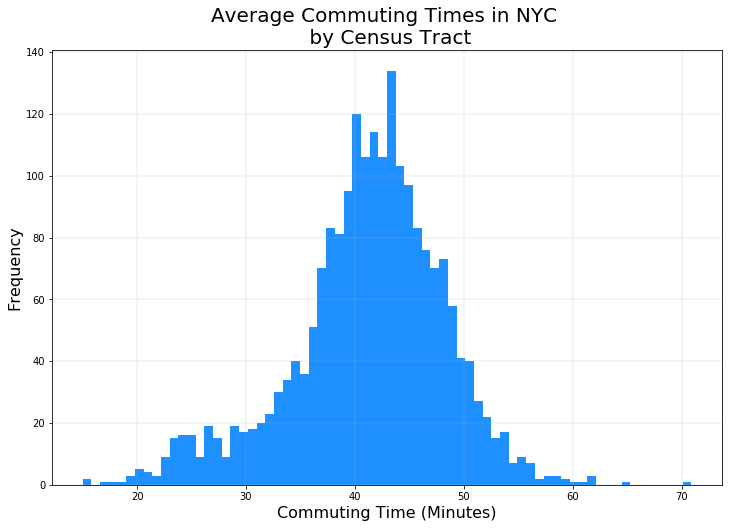

In [63]:
plt.figure(figsize=(12,8))
plt.hist(df_nyc['Total_Time'], bins=70, color='dodgerblue')
plt.xlabel("Commuting Time (Minutes)", fontsize=16)
plt.ylabel("Frequency", fontsize=16)
plt.title("Average Commuting Times in NYC \n by Census Tract", fontsize=20)
plt.grid(linewidth=0.25)
plt.show()
#savefig("commutingtimesNYC.png")

In [64]:
total_car = df['Total_Car'].mean()
total_public = df['Total_Public'].mean()

# CTPP Data

### Census Transportation Planning Products are available at: http://data5.ctpp.transportation.org/ctpp/ 

In [65]:
ctpp = pd.read_csv("ctpp_mon.csv", thousands=',')
print(ctpp.shape)
ctpp.drop_duplicates(inplace=True)
ctpp['GEOID'] = ctpp['Census Tract'].str[:11]
# print(ctpp.shape)
ctpp.dropna(inplace=True)
#ctpp = ctpp[ctpp['GEOID'].isin(geoids)]
ctpp.columns = ['Census Tract', 'Total_Jobs', 'Male_Jobs', 'Female_Jobs', 'GEOID']
print(ctpp.shape)
ctpp.head()

(9705, 4)
(8417, 5)


,Census Tract,Total_Jobs,Male_Jobs,Female_Jobs,GEOID
0,"09001010101 | Census Tract 101.01, Fairfield C...",2955,1695,1260,09001010101
1,"09001010102 | Census Tract 101.02, Fairfield C...",2485,1250,1235,09001010102
2,"09001010201 | Census Tract 102.01, Fairfield C...",2975,1495,1480,09001010201
3,"09001010202 | Census Tract 102.02, Fairfield C...",1345,865,480,09001010202
4,"09001010300 | Census Tract 103, Fairfield Coun...",5275,2335,2940,09001010300


In [66]:
ctpp_geo = shpfile.merge(ctpp, on='GEOID')
print(ctpp_geo.shape)
ctpp_geo.head()

(5479, 14)


,STATEFP,COUNTYFP,TRACTCE,AFFGEOID,GEOID,NAME,LSAD,ALAND,AWATER,geometry,Census Tract,Total_Jobs,Male_Jobs,Female_Jobs
0,36,059,301500,1400000US36059301500,36059301500,3015,CT,3158522,590560,"POLYGON ((-73.711973 40.80972999999999, -73.71...","36059301500 | Census Tract 3015, Nassau County...",330,150,180
1,36,059,302600,1400000US36059302600,36059302600,3026,CT,464050,0,"POLYGON ((-73.705269 40.731513, -73.704869 40....","36059302600 | Census Tract 3026, Nassau County...",675,450,230
2,36,059,304002,1400000US36059304002,36059304002,3040.02,CT,1298691,0,"POLYGON ((-73.600994 40.759758, -73.594331 40....","36059304002 | Census Tract 3040.02, Nassau Cou...",2750,1185,1565
3,36,059,405600,1400000US36059405600,36059405600,4056,CT,1057646,0,"POLYGON ((-73.682953 40.694534, -73.6821049999...","36059405600 | Census Tract 4056, Nassau County...",435,205,230
4,36,059,406802,1400000US36059406802,36059406802,4068.02,CT,399124,0,"POLYGON ((-73.626054 40.711444, -73.624104 40....","36059406802 | Census Tract 4068.02, Nassau Cou...",885,540,350


In [67]:
# Creating data just on New York City 
# Hashed out code for New Jersey 
nycbd = ["061", "047", "081", "085", "005"] #'017' '003'] Hudson & Bergen NJ counties 
states_ny = ['36'] #'34']
ctpp_nyc = ctpp_geo[ctpp_geo['STATEFP'].isin(states_ny)]
ctpp_nyc = ctpp_nyc[ctpp_nyc['COUNTYFP'].isin(nycbd)]
ctpp_nyc['COUNTYFP'].value_counts()

047    761
081    669
005    339
061    288
085    109
Name: COUNTYFP, dtype: int64

In [68]:
#per hectacre
ctpp_nyc_grouped = ctpp_nyc.groupby('COUNTYFP').sum()
ctpp_nyc_grouped['overall_density'] = (ctpp_nyc_grouped['Total_Jobs'] / ctpp_nyc_grouped['ALAND']) * 10000
ctpp_nyc_grouped['male_density'] = (ctpp_nyc_grouped['Male_Jobs'] / ctpp_nyc_grouped['ALAND']) *10000
ctpp_nyc_grouped['female_density'] = ctpp_nyc_grouped['Female_Jobs'] / ctpp_nyc_grouped['ALAND'] *10000
ctpp_nyc_grouped.reset_index(inplace=True)
ctpp_nyc_grouped['COUNTYFP'].replace({'005' : 'Bronx', '047' : 'Brooklyn', '061' : 'Manhattan', '081' : 'Queens', '085' : 'Staten Island'}, inplace=True)
ctpp_nyc_grouped

,COUNTYFP,ALAND,AWATER,Total_Jobs,Male_Jobs,Female_Jobs,overall_density,male_density,female_density
0,Bronx,108910661,39682657,359255,175480,183725,32.986211,16.112289,16.869331
1,Brooklyn,180813964,69955385,763534,402330,361129,42.227601,22.251047,19.972407
2,Manhattan,58677325,28554883,2325555,1264620,1060915,396.329417,215.521072,180.804936
3,Queens,281708062,179390933,677600,378070,299509,24.053270,13.420631,10.631893
4,Staten Island,150675181,33996832,121880,60725,61115,8.088923,4.030193,4.056076


/Users/rspd/anaconda3/lib/python3.6/site-packages/pandas/plotting/_core.py:1716: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  series.name = label


Text(0.5,1,'Job Density per Borough')

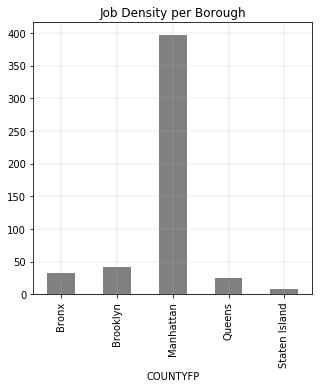

In [69]:
ctpp_nyc_grouped.plot(x=['COUNTYFP'], y=['overall_density'], kind='bar', figsize=(5,5), legend=False, color='gray')
plt.grid(linewidth=0.25)
plt.title("Job Density per Borough")

/Users/rspd/anaconda3/lib/python3.6/site-packages/pandas/plotting/_core.py:1716: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  series.name = label


Text(0.5,0,'')

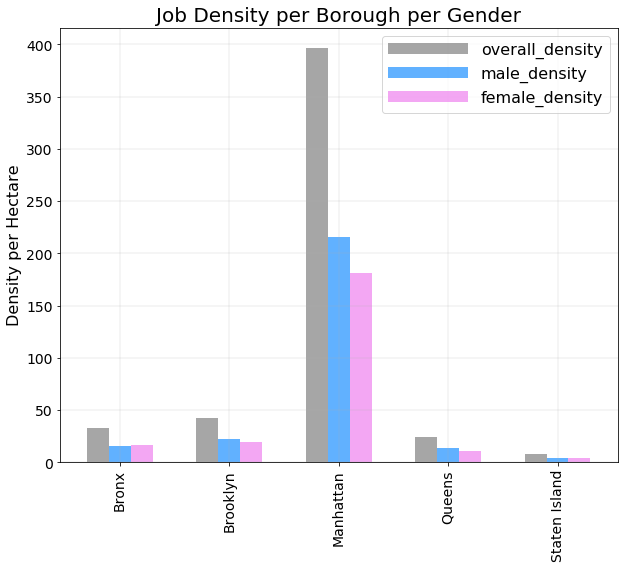

In [70]:
ctpp_nyc_grouped.plot(x=['COUNTYFP'], y=['overall_density', 'male_density', 'female_density'],
            kind='bar', figsize=(10,8), color=['grey', 'dodgerblue', 'violet'],
           fontsize=14, width=0.6, alpha=0.7)
plt.grid(linewidth=(0.25))
plt.title("Job Density per Borough per Gender", fontsize='20')
plt.ylabel("Density per Hectare", fontsize=16)
plt.xlabel("")
#savefig("densityahhh.png")

# Merging shapfile (with CTPP data) with census data

In [71]:
geo_df = ctpp_geo.merge(df, on='GEOID')
print(geo_df.shape)
#geo_df.dropna(inplace=True)
print(geo_df.shape)
print('Columns:', list(geo_df.columns))
print(type(geo_df)) #Just to make sure it is a geodataframe and not a normal df
geo_df.head()

(5357, 35)
(5357, 35)
Columns: ['STATEFP', 'COUNTYFP', 'TRACTCE', 'AFFGEOID', 'GEOID', 'NAME_x', 'LSAD', 'ALAND', 'AWATER', 'geometry', 'Census Tract', 'Total_Jobs', 'Male_Jobs', 'Female_Jobs', 'NAME_y', 'Total_Car', 'state', 'county', 'tract', 'stct', 'Male_Car', 'Female_Car', 'Total_Public', 'Male_Public', 'Female_Public', 'Total_PublicTime', 'Total_CarTime', 'Total_Housing', 'Total_Income', 'Female_Income', 'Male_Income', 'Total_Time', 'Female_Time', 'Male_Time', 'Total_Population']
<class 'geopandas.geodataframe.GeoDataFrame'>


,STATEFP,COUNTYFP,TRACTCE,AFFGEOID,GEOID,NAME_x,LSAD,ALAND,AWATER,geometry,...,Total_PublicTime,Total_CarTime,Total_Housing,Total_Income,Female_Income,Male_Income,Total_Time,Female_Time,Male_Time,Total_Population
0,36,059,301500,1400000US36059301500,36059301500,3015,CT,3158522,590560,"POLYGON ((-73.711973 40.80972999999999, -73.71...",...,57.9,28.7,3264.0,86375.0,44250.0,125921.0,40.2,36.2,42.9,3095
1,36,059,302600,1400000US36059302600,36059302600,3026,CT,464050,0,"POLYGON ((-73.705269 40.731513, -73.704869 40....",...,NaN,NaN,2239.0,52297.0,51489.0,53528.0,35.9,31.6,39.7,2585
2,36,059,304002,1400000US36059304002,36059304002,3040.02,CT,1298691,0,"POLYGON ((-73.600994 40.759758, -73.594331 40....",...,78.0,23.9,1717.0,35957.0,33266.0,42500.0,30.2,29.0,31.2,4365
3,36,059,405600,1400000US36059405600,36059405600,4056,CT,1057646,0,"POLYGON ((-73.682953 40.694534, -73.6821049999...",...,70.4,30.7,2144.0,45723.0,32583.0,58342.0,35.0,25.6,43.1,4561
4,36,059,406802,1400000US36059406802,36059406802,4068.02,CT,399124,0,"POLYGON ((-73.626054 40.711444, -73.624104 40....",...,NaN,NaN,2893.0,30730.0,30833.0,30692.0,25.8,24.4,26.8,4439


### Creating simplistic density metrics 

NB: This is the easy way of calculating population and job densities (population / land area). Particularly with the Census data, the land area provided includes nature, etc. A preferred and more rigorous way is to calculate population density based on the amount of built up land. (Best done in GIS)

In [72]:
geo_df['Pop_Density'] = (geo_df['Total_Population'] / geo_df['ALAND']) * 100
geo_df['Pop_Density'].mean()

0.9633825793339497

In [73]:
geo_df['Total_Job_Density'] = (geo_df['Total_Jobs'] / geo_df['ALAND'] * 10000)
geo_df['Female_Job_Density'] = (geo_df['Female_Jobs'] / geo_df['ALAND'] * 10000)
geo_df['Male_Job_Density'] = (geo_df['Male_Jobs'] / geo_df['ALAND'] * 10000)
print(geo_df['Total_Job_Density'].min())
print(geo_df['Total_Job_Density'].max())
print(geo_df['Total_Job_Density'].mean())
print(geo_df['Total_Job_Density'].median())
print(geo_df['Total_Job_Density'].std())

0.0
3220.210272726082
44.01813004637689
9.587708586085087
180.9488940694531


## Creating a dataframe just for New York City

In [74]:
# Creating data just on New York City 
# Hashed out code for New Jersey 
nycbd = ["061", "047", "081", "085", '005'] #'017' '003'] Hudson & Bergen NJ counties 
states_nynj = ['36'] #'34']
geo_df_nyc = geo_df[ctpp_geo['STATEFP'].isin(states_nynj)]
geo_df_nyc = geo_df_nyc[geo_df_nyc['COUNTYFP'].isin(nycbd)]
geo_df_nyc['COUNTYFP'].value_counts()

/Users/rspd/anaconda3/lib/python3.6/site-packages/geopandas/geodataframe.py:398: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  result = super(GeoDataFrame, self).__getitem__(key)


047    743
081    636
005    325
061    276
085    107
Name: COUNTYFP, dtype: int64

### Creating a dataframe just for lowest incomes

In [75]:
mean = geo_df['Total_Income'].mean()
print(mean)
std = geo_df['Total_Income'].std()
print(std)
geo_df_lowin = geo_df[geo_df['Total_Income'] < (mean-std)]
print(geo_df.shape)
geo_df_lowin.shape
print(mean-std)

41500.24379316782
17352.048730024
(5357, 39)
24148.195063143823


### Creating a dataframe just for longest commute times

In [76]:
mean = geo_df['Total_Time'].mean()
print(mean)
std = geo_df['Total_Time'].std()
print(std)
geo_df_longco = geo_df[geo_df['Total_Time'] > (mean+std)]
print(geo_df.shape)
geo_df_longco.shape

35.347022587268924
8.039284903333005
(5357, 39)


(926, 39)

# Maps! And more maps!

**New York CSA**

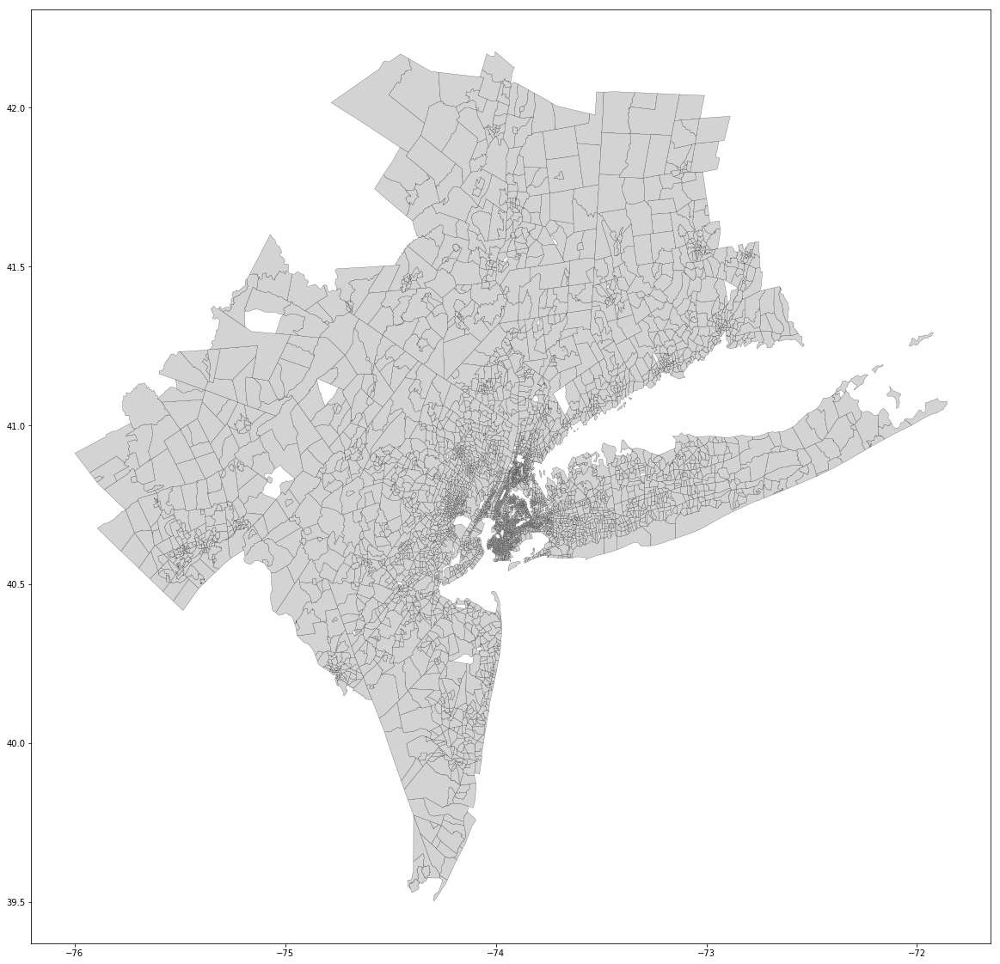

In [77]:
fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111)
geo_df.plot(ax=ax, edgecolor='k', color='lightgrey', linewidth=0.2)

**New York City**

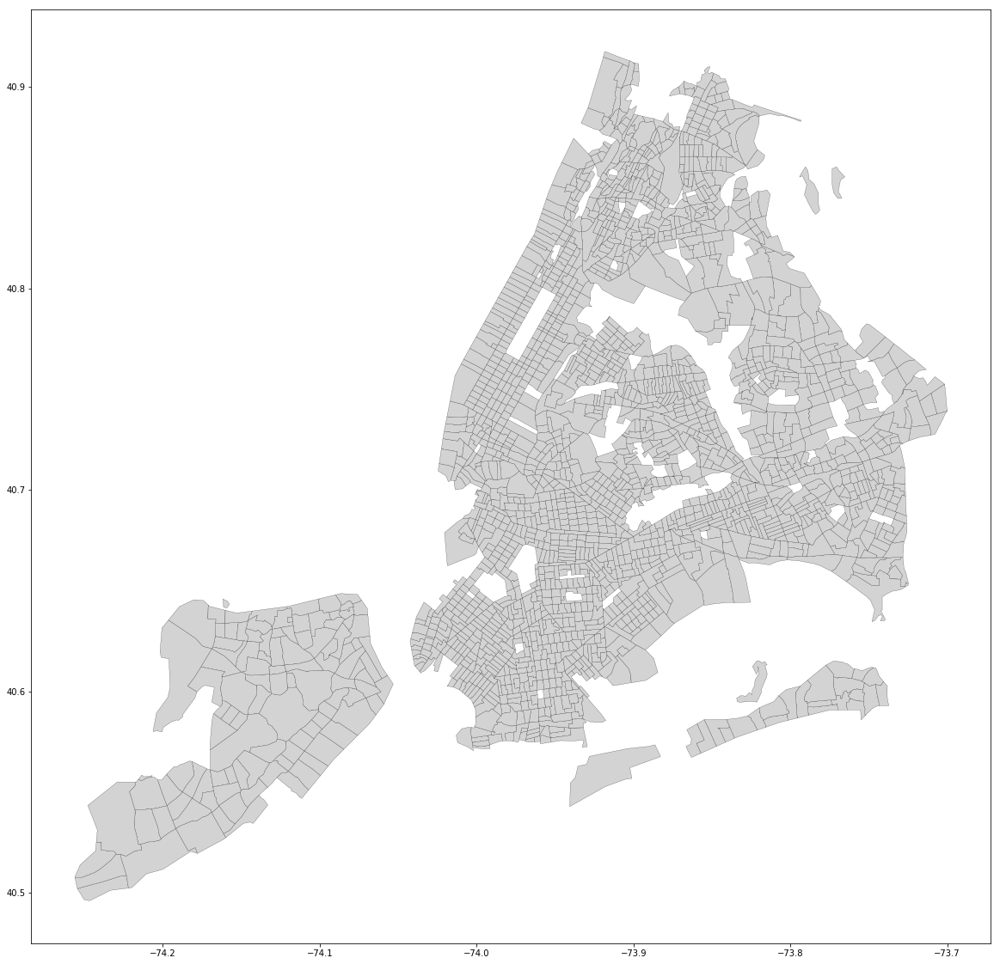

In [78]:
fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111)
geo_df_nyc.plot(ax=ax, edgecolor='k', color='lightgrey', linewidth=0.2)

### Commute Duration

Text(0.5,1,'Female % Commuting by Car')

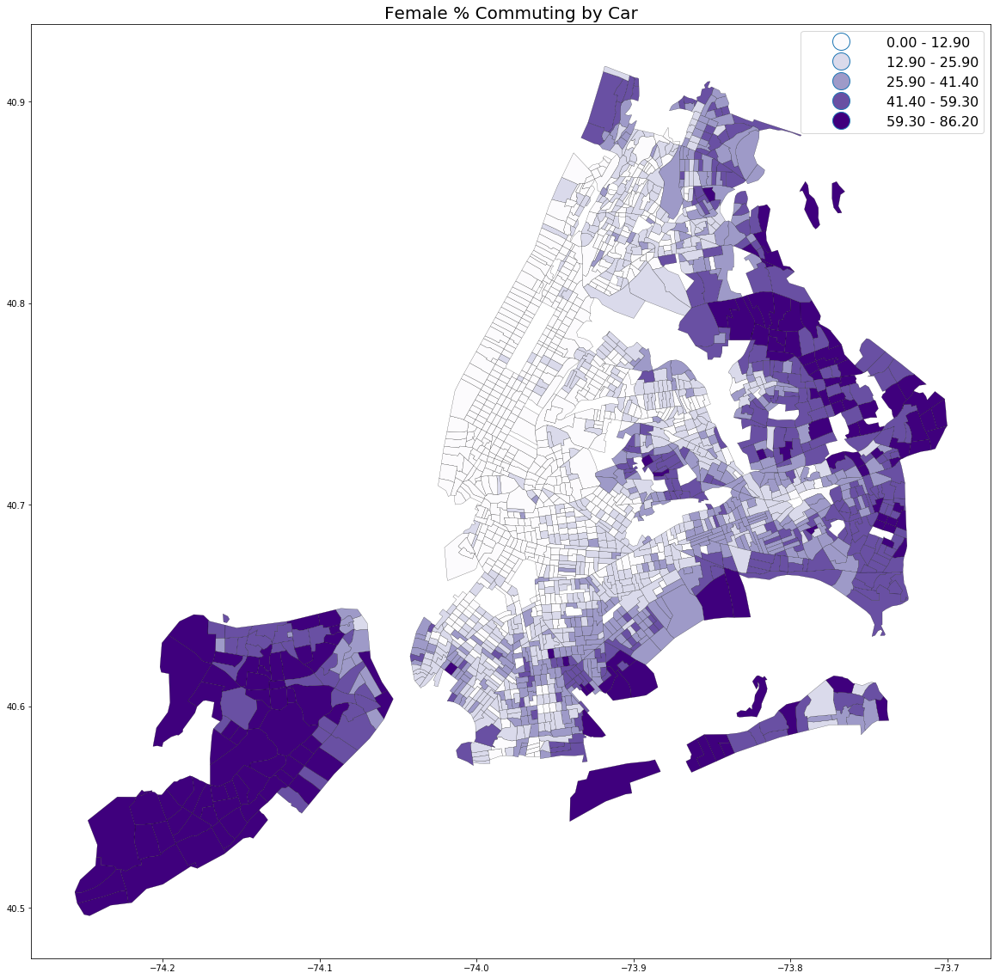

In [79]:
fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111)
geo_df_nyc.plot(column='Female_Car', ax=ax, cmap='Purples', scheme='fisher_jenks', edgecolor='k', linewidth=0.2, legend=True)
plt.title("Female % Commuting by Car", fontsize='20')

Text(0.5,1,'Male % Commuting by Car')

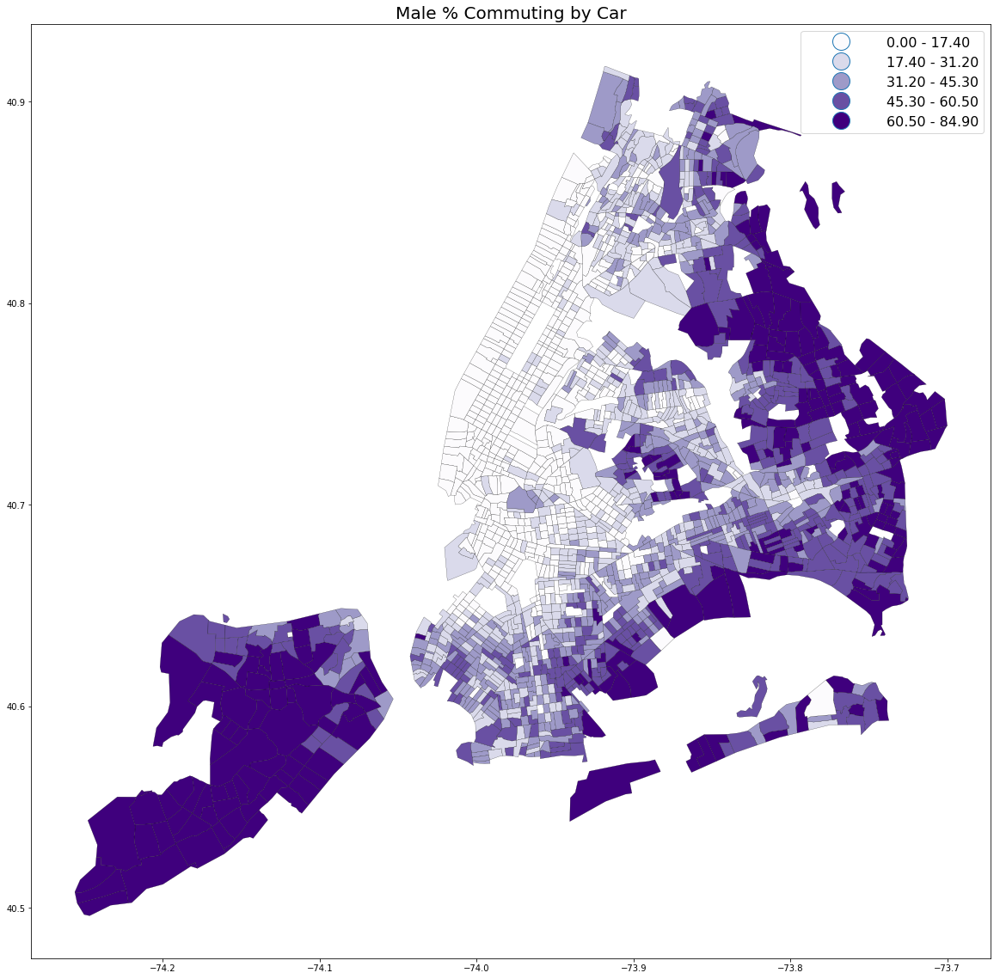

In [80]:
fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111)
geo_df_nyc.plot(column='Male_Car', ax=ax, cmap='Purples', scheme='fisher_jenks', edgecolor='k', linewidth=0.2, legend=True)
plt.title("Male % Commuting by Car", fontsize='20')

Text(0.5,1,'Female % Commuting by Public Transit')

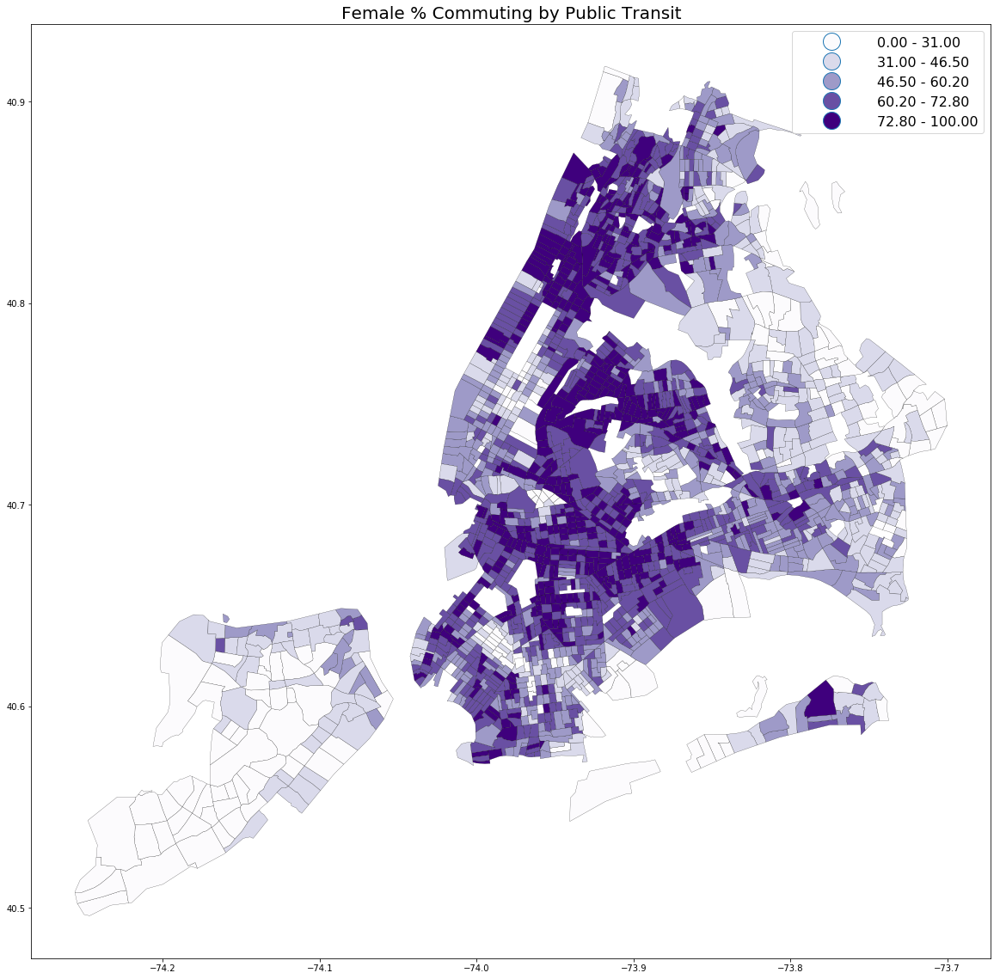

In [81]:
fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111)
geo_df_nyc.plot(column='Female_Public', ax=ax, cmap='Purples', scheme='fisher_jenks', edgecolor='k', linewidth=0.2, legend=True)
plt.title("Female % Commuting by Public Transit", fontsize='20')

Text(0.5,1,'Male % Commuting by Public Transit')

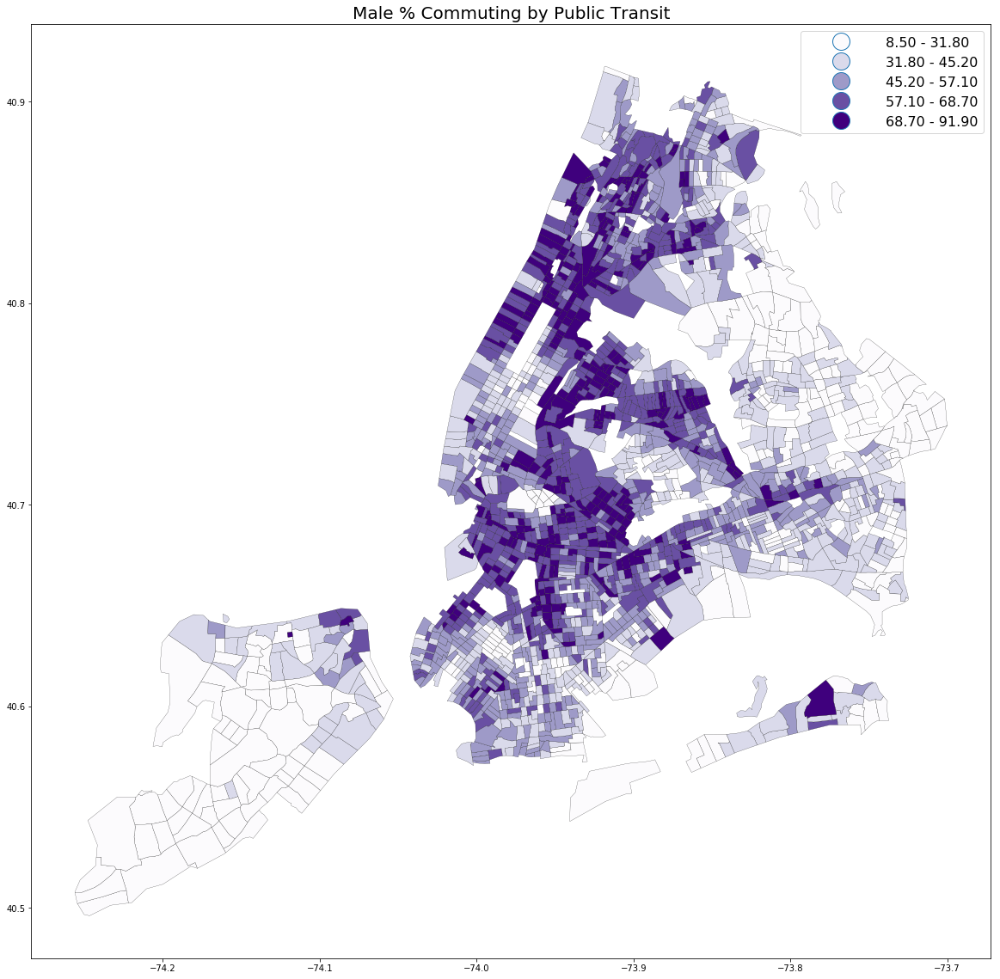

In [82]:
fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111)
geo_df_nyc.plot(column='Male_Public', ax=ax, cmap='Purples', scheme='fisher_jenks', edgecolor='k', linewidth=0.2, legend=True)
plt.title("Male % Commuting by Public Transit", fontsize='20')

### Mapping Income

**New York CSA**

Text(0.5,1,'NY CSA Income')

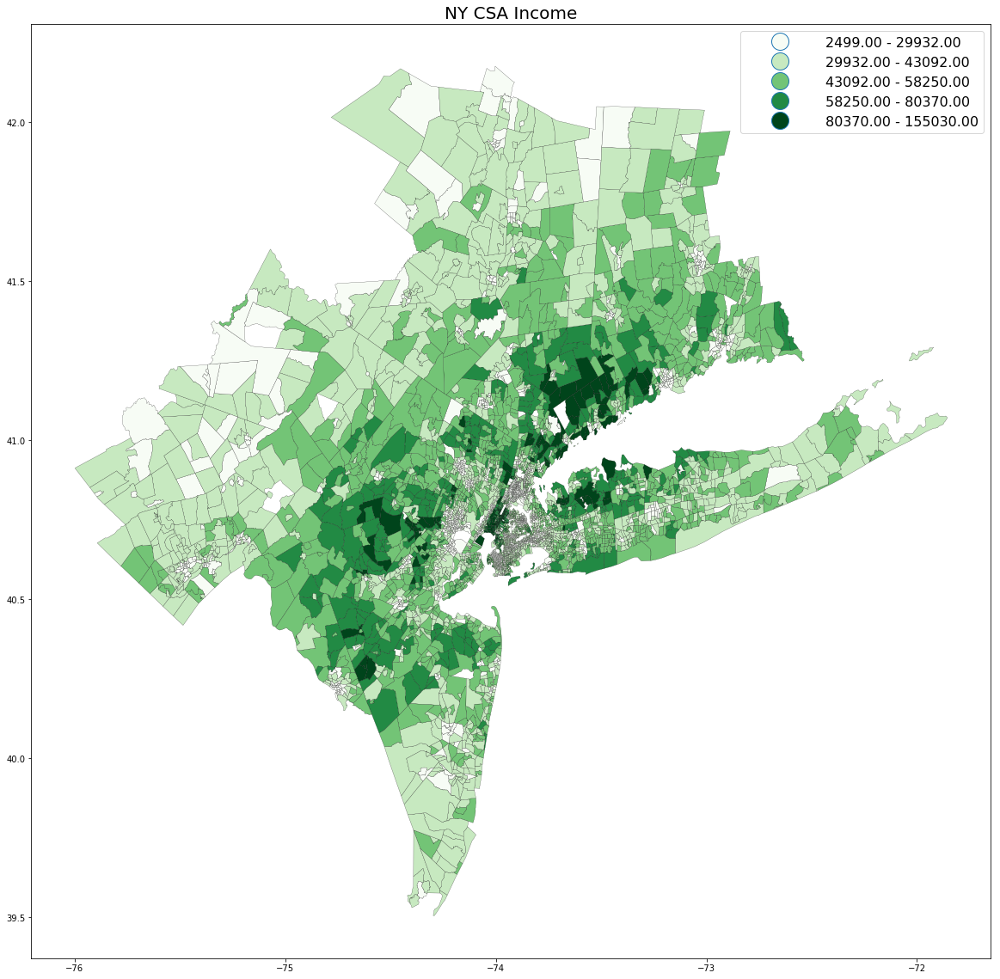

In [83]:
fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111)
geo_df.plot(column='Total_Income', ax=ax, cmap='Greens', scheme='fisher_jenks', edgecolor='k', linewidth=0.2, legend=True)
plt.title("NY CSA Income", fontsize='20')

**New York City**

Text(0.5,1,'NYC Income')

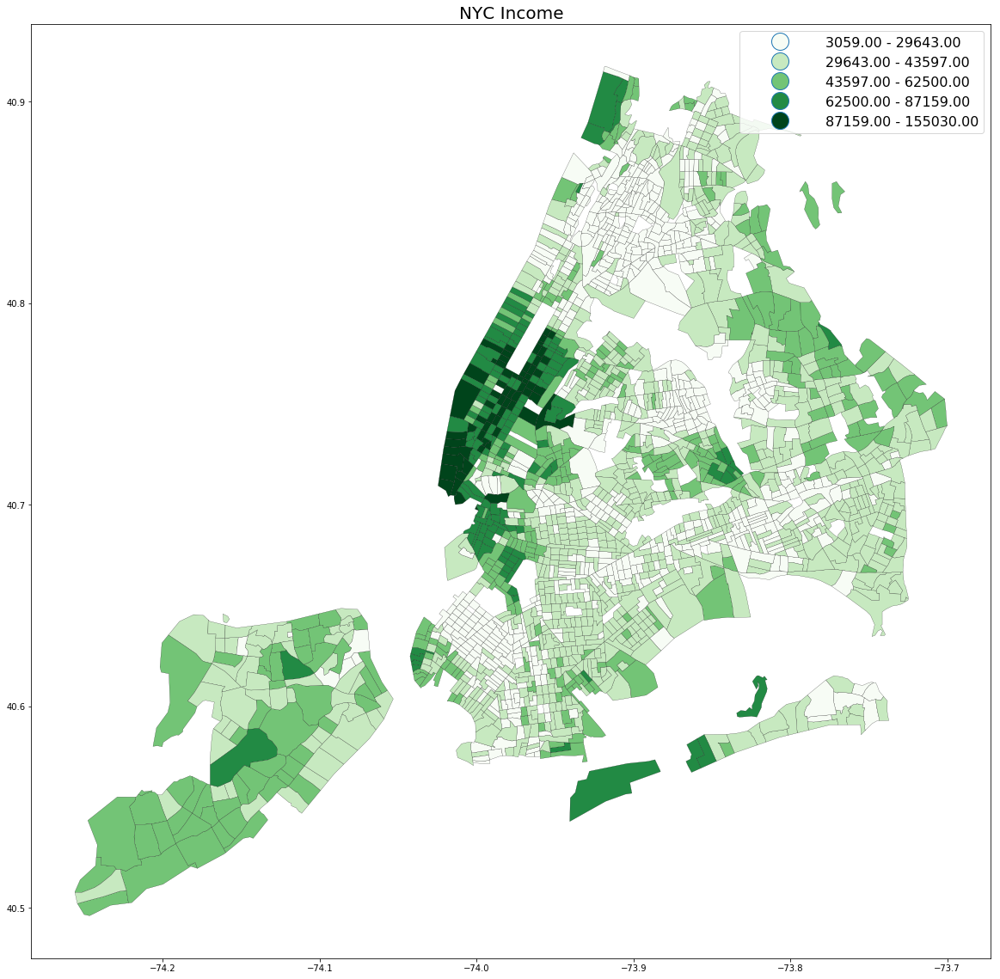

In [84]:
fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111)
geo_df_nyc.plot(column='Total_Income', ax=ax, cmap='Greens', scheme='fisher_jenks', edgecolor='k', linewidth=0.2, legend=True)
plt.title("NYC Income", fontsize=20)

### Population Density

**New York CSA**

Text(0.5,1,'Population Density')

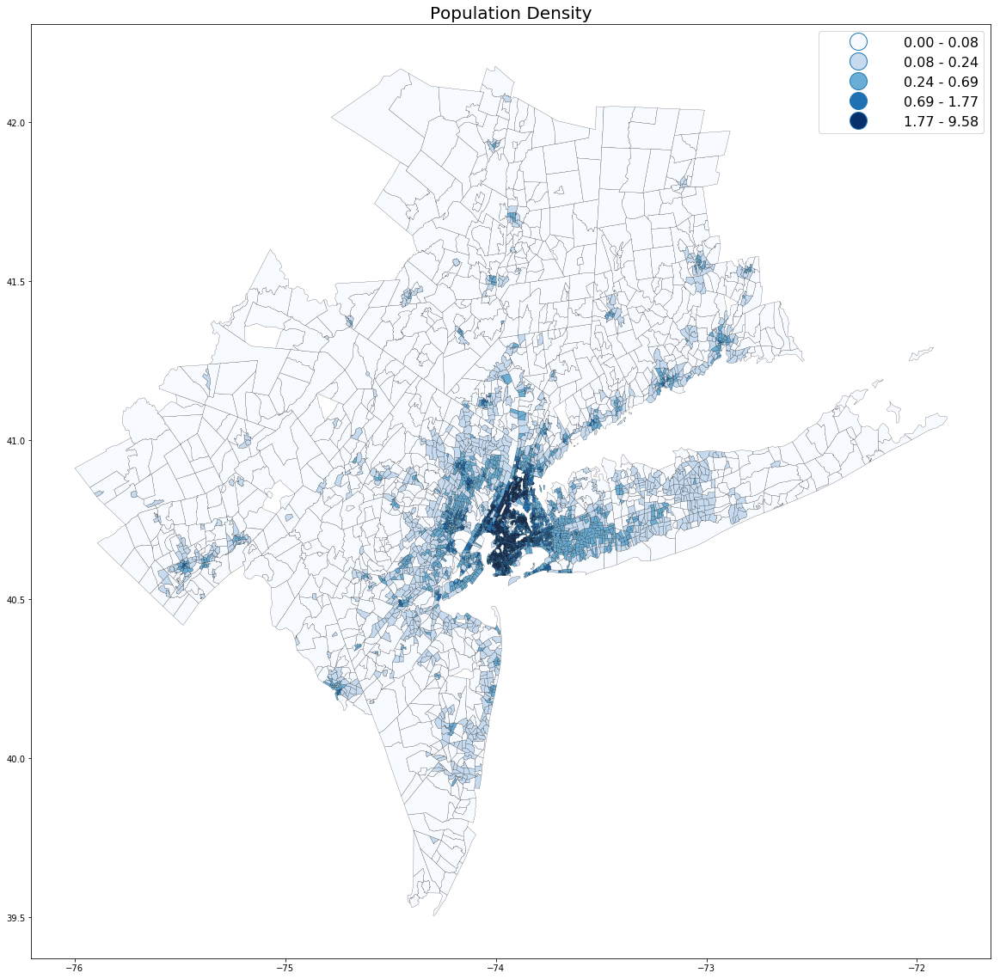

In [85]:
fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111)
geo_df.plot(column='Pop_Density', ax=ax, cmap='Blues', scheme='quantiles', edgecolor='k', linewidth=0.2, legend=True)
plt.title("Population Density", fontsize=20)

**New York City**

Text(0.5,1,'Population Density')

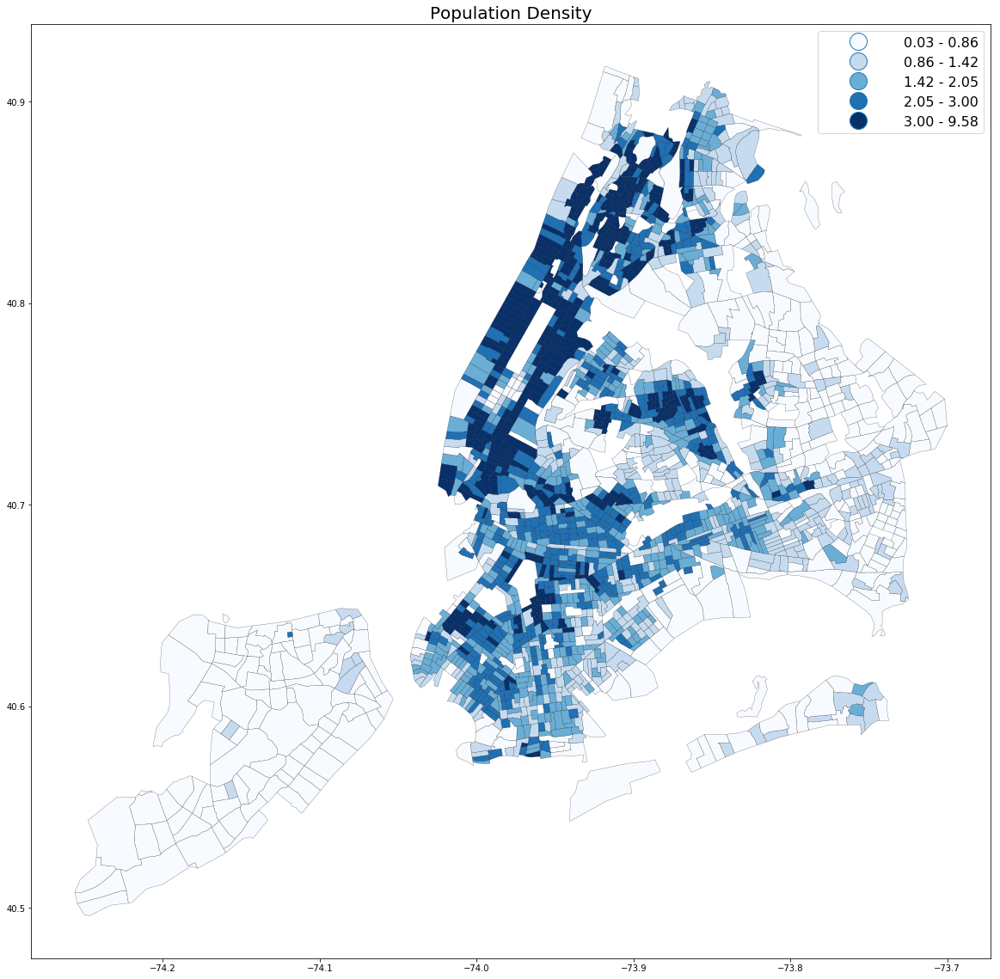

In [86]:
fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111)
geo_df_nyc.plot(column='Pop_Density', ax=ax, cmap='Blues', scheme='quantiles', edgecolor='k', linewidth=0.2, legend=True)
plt.title("Population Density", fontsize=20)

### Job Density

**New York CSA**

Text(0.5,1,'NY CSA Job Density')

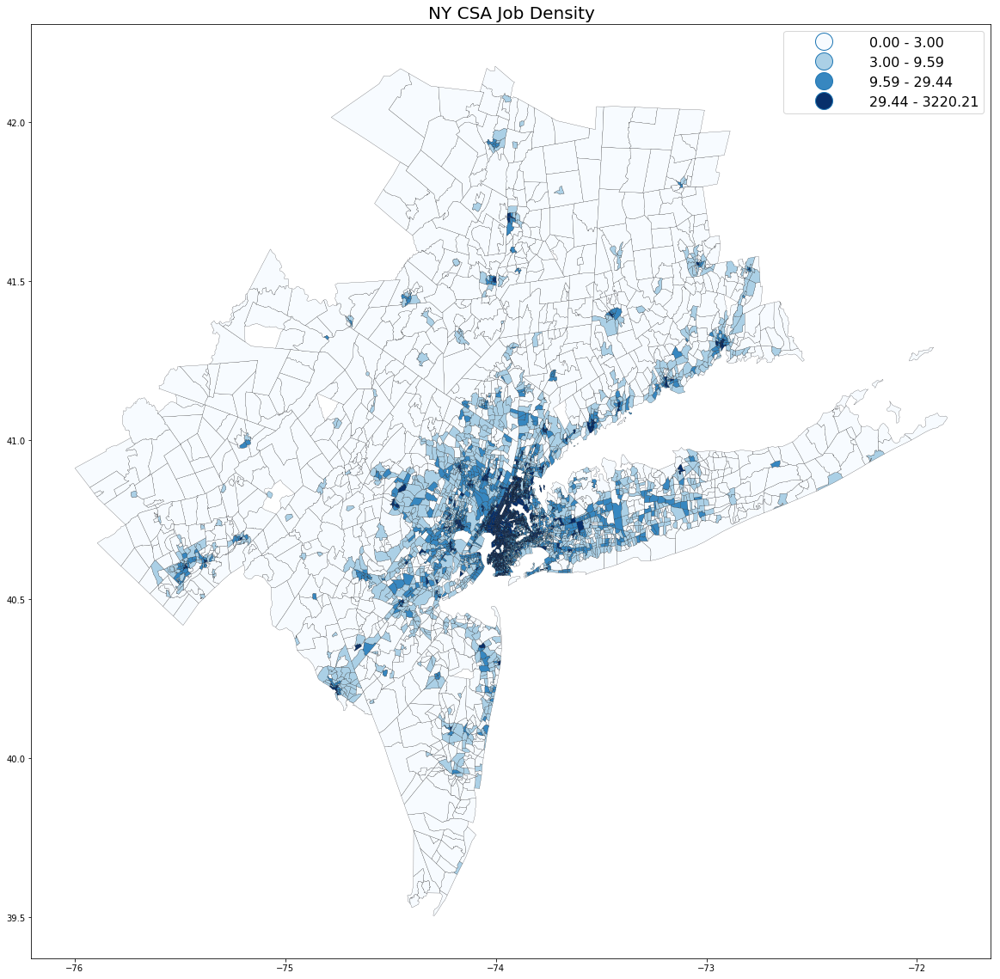

In [87]:
fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111)
geo_df.plot(column='Total_Job_Density', ax=ax, cmap='Blues', scheme='quantiles', k=4, edgecolor='k', linewidth=0.2, legend=True)
plt.title("NY CSA Job Density", fontsize=20)

**New York City**

Text(0.5,1,'Job Density in NYC')

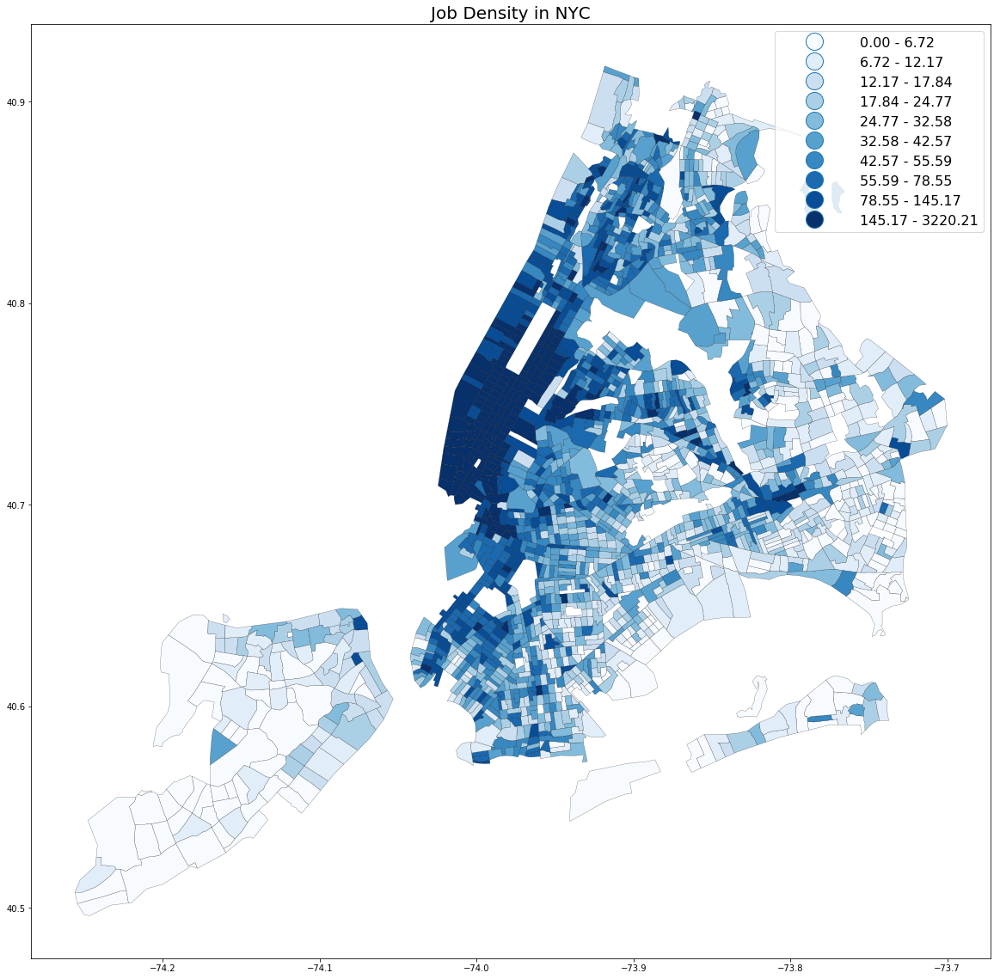

In [88]:
fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111)
geo_df_nyc.plot(column='Total_Job_Density', ax=ax, cmap='Blues', scheme='quantiles', k=10, edgecolor='k', linewidth=0.2, legend=True)
plt.title("Job Density in NYC", fontsize=20)

**New York City (Female)**

Text(0.5,1,'Female Job Density')

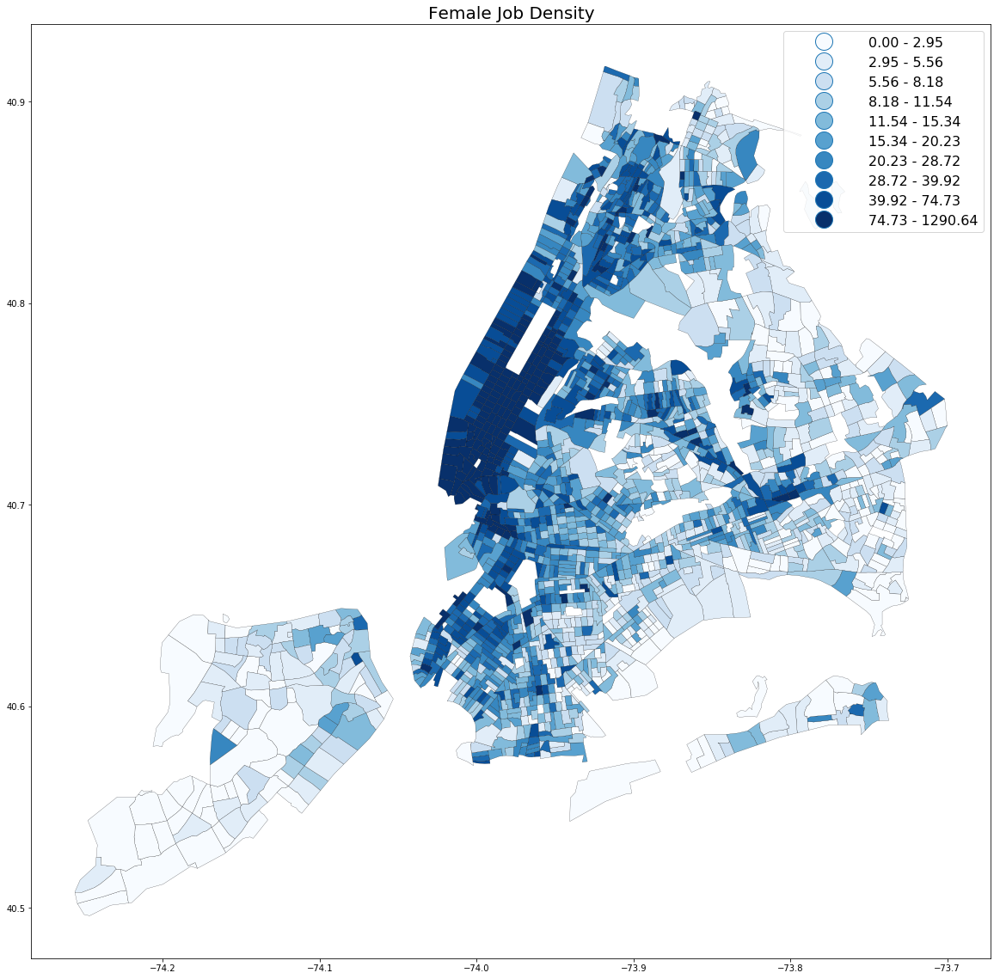

In [89]:
fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111)
geo_df_nyc.plot(column='Female_Job_Density', ax=ax, cmap='Blues', scheme='quantiles', k=10, edgecolor='k', linewidth=0.2, legend=True)
plt.title("Female Job Density", fontsize=20)

**New York City (Male)**

Text(0.5,1,'Male Job Density')

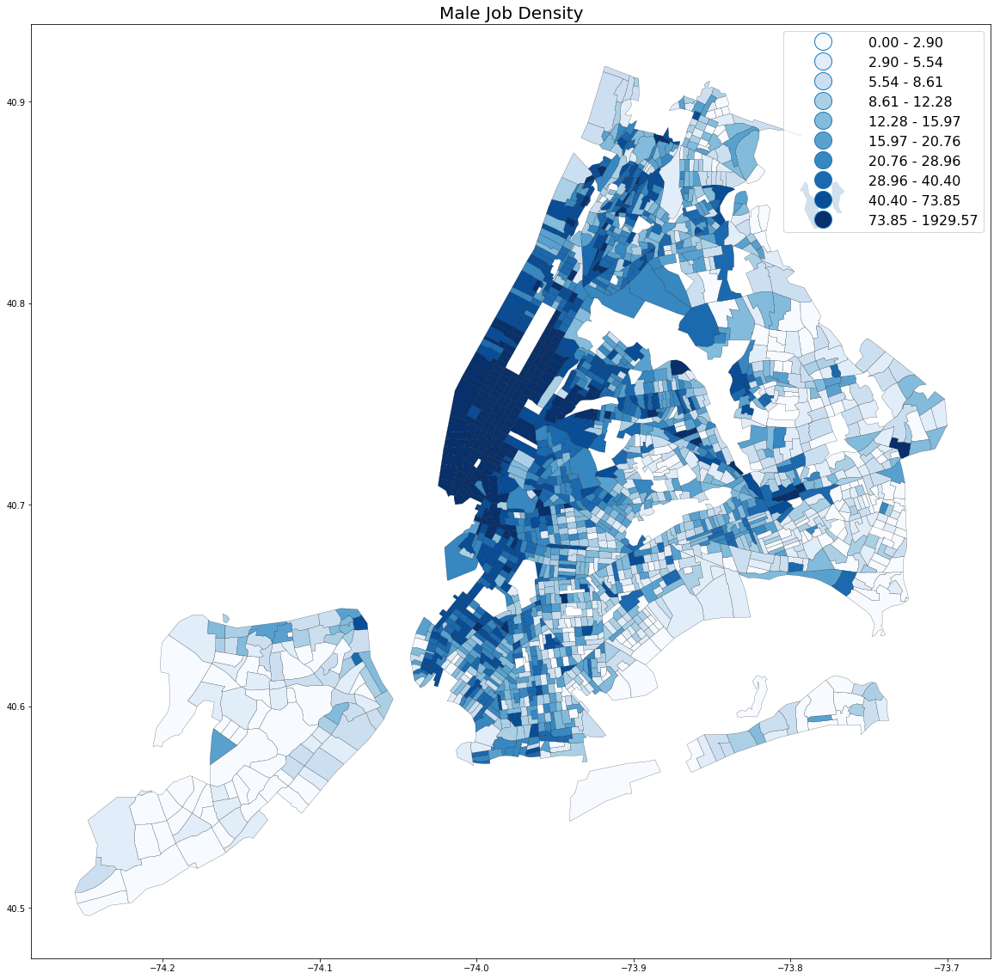

In [90]:
fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111)
geo_df_nyc.plot(column='Male_Job_Density', ax=ax, cmap='Blues', scheme='quantiles', k=10, edgecolor='k', linewidth=0.2, legend=True)
plt.title("Male Job Density", fontsize=20)

**New York City** 

## Analysis

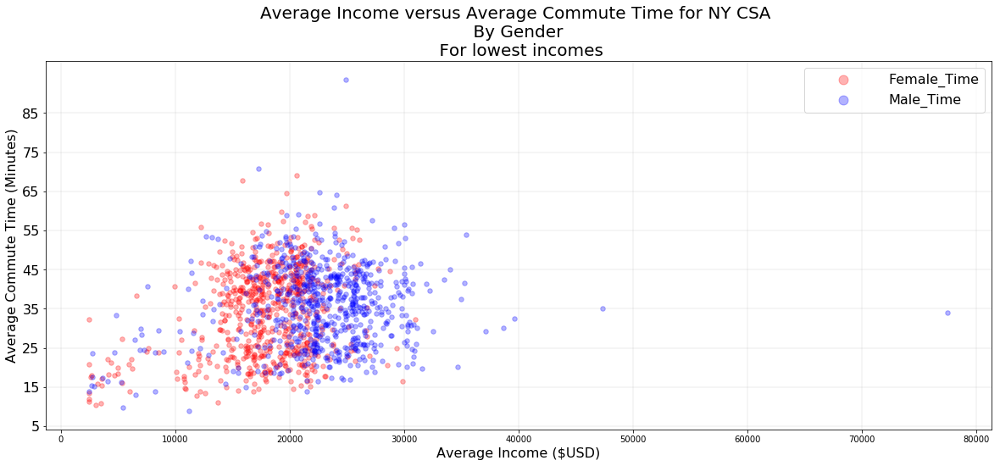

In [91]:
df_lowin = pd.DataFrame(geo_df_lowin)
ax = plt.figure(figsize=(20,8)).add_subplot(111)
plt.scatter(df_lowin['Female_Income'], df_lowin['Female_Time'], alpha=0.3, color='r', s=30)
plt.scatter(df_lowin['Male_Income'], df_lowin['Male_Time'], alpha=0.3, color='b', s=30)
plt.xlabel("Average Income ($USD)", fontsize=16)
plt.ylabel("Average Commute Time (Minutes)", fontsize=16)
#plt.xticks(np.arange(0,255000,20000), rotation=30, fontsize=16)
plt.yticks(np.arange(5,89,10), fontsize=16)
plt.title("Average Income versus Average Commute Time for NY CSA \n By Gender \n For lowest incomes", fontsize=20)
plt.grid(linewidth=0.25)
plt.legend(loc='upper right')
plt.show()
# savefig("nycsa_income_time.png")

In [92]:
df_nyc = pd.DataFrame(geo_df_nyc)

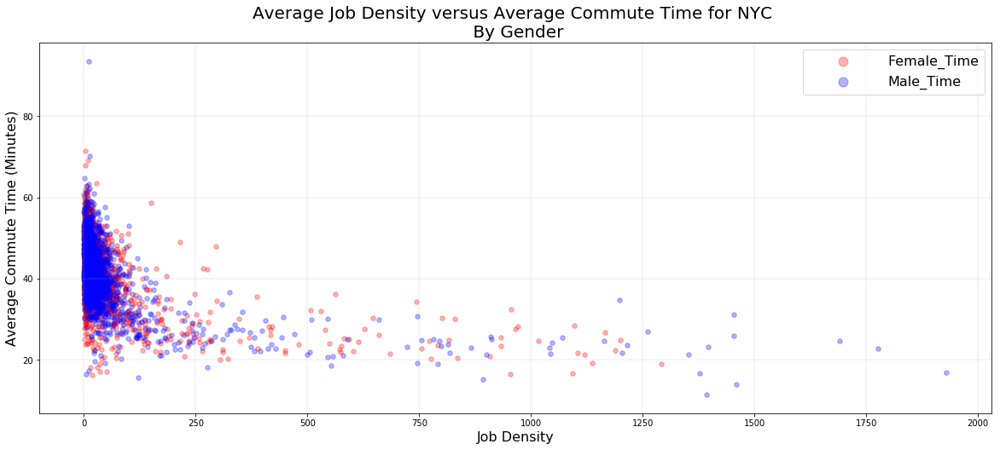

In [93]:
ax = plt.figure(figsize=(20,8)).add_subplot(111)
plt.scatter(df_nyc['Female_Job_Density'], df_nyc['Female_Time'], alpha=0.3, color='r', s=30)
plt.scatter(df_nyc['Male_Job_Density'], df_nyc['Male_Time'], alpha=0.3, color='b', s=30)
plt.xlabel("Job Density", fontsize=16)
plt.ylabel("Average Commute Time (Minutes)", fontsize=16)
plt.title("Average Job Density versus Average Commute Time for NYC \n By Gender", fontsize=20)
plt.grid(linewidth=0.25)
plt.legend(loc='upper right')
plt.show()

In [94]:
df = pd.DataFrame(geo_df)

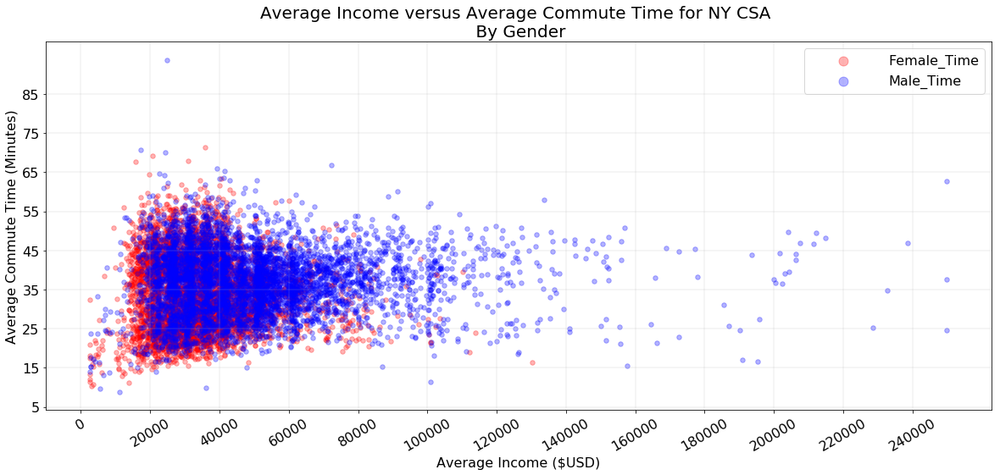

<Figure size 432x288 with 0 Axes>

In [95]:
ax = plt.figure(figsize=(20,8)).add_subplot(111)
#df.plot(kind='scatter', y='Total_Time', x='Total_Income', figsize=(12,8), color='g', alpha=0.3, s=30, ax=ax)
plt.scatter(df['Female_Income'], df['Female_Time'], alpha=0.3, color='r', s=30)
plt.scatter(df['Male_Income'], df['Male_Time'], alpha=0.3, color='b', s=30)
plt.xlabel("Average Income ($USD)", fontsize=16)
plt.ylabel("Average Commute Time (Minutes)", fontsize=16)
plt.xticks(np.arange(0,255000,20000), rotation=30, fontsize=16)
plt.yticks(np.arange(5,89,10), fontsize=16)
plt.title("Average Income versus Average Commute Time for NY CSA \n By Gender", fontsize=20)
plt.grid(linewidth=0.25)
plt.legend(loc='upper right')
plt.show()
savefig("nycsa_income_time.png")

In [96]:
df_nyc.corr().sort_values('Total_Income')['Total_Income']

Total_Time           -0.488686
Female_Time          -0.447003
Male_Time            -0.442527
Female_Public        -0.258513
Total_PublicTime     -0.235328
Total_Public         -0.229218
Male_Public          -0.172494
Male_Car             -0.139485
Total_Car            -0.081169
Pop_Density          -0.049998
Female_Car           -0.010741
Total_Population      0.015434
ALAND                 0.088879
AWATER                0.111400
Total_Housing         0.155636
Total_CarTime         0.230582
Male_Jobs             0.489101
Total_Jobs            0.497981
Female_Jobs           0.499700
Male_Job_Density      0.511451
Female_Job_Density    0.512966
Total_Job_Density     0.515430
Female_Income         0.933174
Male_Income           0.944366
Total_Income          1.000000
Name: Total_Income, dtype: float64

In [97]:
df_nyc.corr().sort_values('Male_Income')['Male_Income']

Total_Time           -0.509681
Female_Time          -0.474919
Male_Time            -0.453925
Total_PublicTime     -0.274596
Female_Public        -0.268360
Total_Public         -0.239713
Male_Public          -0.181734
Male_Car             -0.147440
Total_Car            -0.097903
Female_Car           -0.036307
Pop_Density          -0.022643
Total_Population      0.030605
ALAND                 0.083994
AWATER                0.097856
Total_Housing         0.179440
Total_CarTime         0.204596
Male_Jobs             0.492855
Total_Jobs            0.503329
Female_Jobs           0.506953
Male_Job_Density      0.526232
Female_Job_Density    0.529710
Total_Job_Density     0.531198
Female_Income         0.806561
Total_Income          0.944366
Male_Income           1.000000
Name: Male_Income, dtype: float64

In [98]:
df_nyc.corr().sort_values('Female_Income')['Female_Income']

Total_Time           -0.412011
Male_Time            -0.390046
Female_Time          -0.357053
Female_Public        -0.194795
Total_Public         -0.171289
Total_PublicTime     -0.141518
Male_Car             -0.141154
Male_Public          -0.127994
Total_Car            -0.083881
Pop_Density          -0.060504
Female_Car           -0.011148
Total_Population      0.000789
ALAND                 0.061616
AWATER                0.102791
Total_Housing         0.113243
Total_CarTime         0.186035
Male_Jobs             0.435373
Total_Jobs            0.444282
Female_Jobs           0.447090
Male_Job_Density      0.449961
Female_Job_Density    0.454262
Total_Job_Density     0.454787
Male_Income           0.806561
Total_Income          0.933174
Female_Income         1.000000
Name: Female_Income, dtype: float64

(0.006932806135623057, 0.8578448090171846)


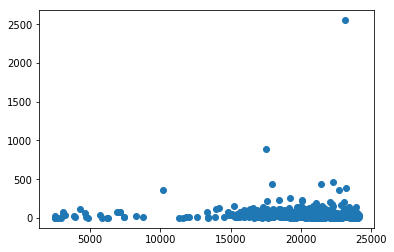

In [99]:
x = df_lowin['Total_Income']
y = df_lowin['Total_Job_Density']
print(pearsonr(x,y))
plt.scatter(x,y)

(0.04924180724477414, 0.20302340916146497)


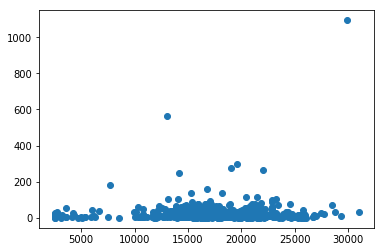

In [100]:
x = df_lowin['Female_Income']
y = df_lowin['Female_Job_Density']
print(pearsonr(x,y))
plt.scatter(x,y)

(-0.012964658056185293, 0.7376482390495533)


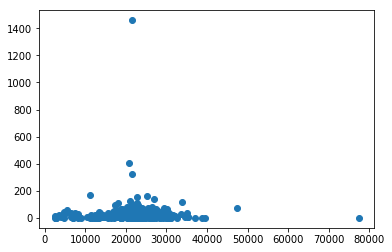

In [101]:
x = df_lowin['Male_Income']
y = df_lowin['Male_Job_Density']
print(pearsonr(x,y))
plt.scatter(x,y)

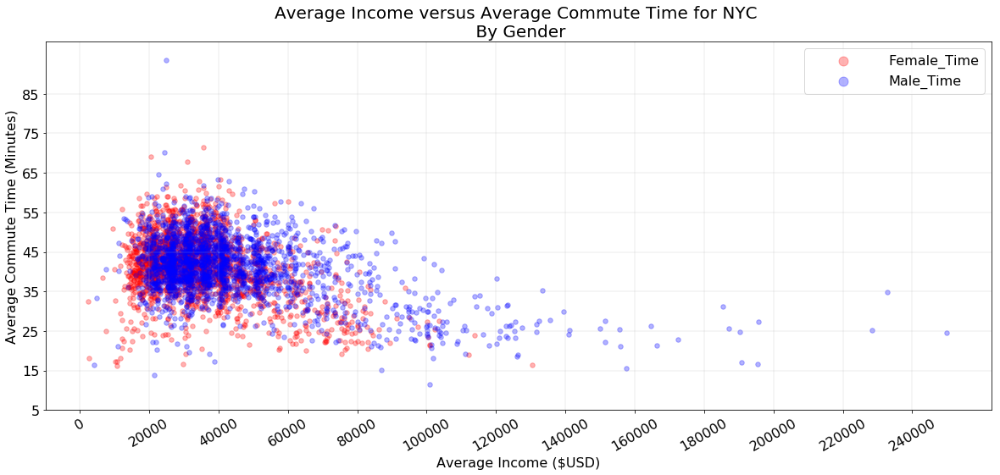

<Figure size 432x288 with 0 Axes>

In [102]:
ax = plt.figure(figsize=(20,8)).add_subplot(111)
plt.scatter(df_nyc['Female_Income'], df_nyc['Female_Time'], alpha=0.3, color='r', s=30)
plt.scatter(df_nyc['Male_Income'], df_nyc['Male_Time'], alpha=0.3, color='b', s=30)
plt.xlabel("Average Income ($USD)", fontsize=16)
plt.ylabel("Average Commute Time (Minutes)", fontsize=16)
plt.xticks(np.arange(0,255000,20000), rotation=30, fontsize=16)
plt.yticks(np.arange(5,89,10), fontsize=16)
plt.title("Average Income versus Average Commute Time for NYC \n By Gender", fontsize=20)
plt.grid(linewidth=0.25)
plt.legend(loc='upper right')
plt.show()
savefig("nycsa_income_time.png")

# Regression

In [103]:
lm = smf.ols(formula='Total_Income~Total_Time + Total_Public + Total_Housing', data=df).fit()
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           Total_Income   R-squared:                       0.219
Model:                            OLS   Adj. R-squared:                  0.219
Method:                 Least Squares   F-statistic:                     478.5
Date:                Sat, 12 May 2018   Prob (F-statistic):          5.10e-274
Time:                        14:09:57   Log-Likelihood:                -56417.
No. Observations:                5110   AIC:                         1.128e+05
Df Residuals:                    5106   BIC:                         1.129e+05
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept      1.966e+04   1184.032     16.605      0.000    1.73e+04     2.2e+04
Total_Time      -44.4865     33.796     -1.316      0.188    -110.742      21.769
Total_Public    -37.1866     11.070     -3.359      0.001     -58.888     -15.485
Total_Housing    12.7009      0.342     37.105      0.000      12.030      13.372
==============================================================================
Omnibus:                      840.985   Durbin-Watson:                   1.382
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2087.718
Skew:                           0.917   Prob(JB):                         0.00
Kurtosis:                       5.538   Cond. No.                     1.16e+04
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.16e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [104]:
lm = smf.ols(formula='Female_Income~Female_Time + Female_Public + Total_Housing', data=df).fit()
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          Female_Income   R-squared:                       0.094
Model:                            OLS   Adj. R-squared:                  0.093
Method:                 Least Squares   F-statistic:                     176.4
Date:                Sat, 12 May 2018   Prob (F-statistic):          7.66e-109
Time:                        14:09:57   Log-Likelihood:                -55418.
No. Observations:                5110   AIC:                         1.108e+05
Df Residuals:                    5106   BIC:                         1.109e+05
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept      2.301e+04    921.427     24.970      0.000    2.12e+04    2.48e+04
Female_Time     -39.2487     27.729     -1.415      0.157     -93.610      15.112
Female_Public    24.8634      9.446      2.632      0.009       6.345      43.382
Total_Housing     6.4576      0.281     22.987      0.000       5.907       7.008
==============================================================================
Omnibus:                     1036.457   Durbin-Watson:                   1.450
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             3122.456
Skew:                           1.045   Prob(JB):                         0.00
Kurtosis:                       6.209   Cond. No.                     1.10e+04
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.1e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [105]:
lm = smf.ols(formula='Male_Income~Male_Time + Male_Public + Total_Housing', data=df).fit()
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            Male_Income   R-squared:                       0.261
Model:                            OLS   Adj. R-squared:                  0.261
Method:                 Least Squares   F-statistic:                     601.8
Date:                Sat, 12 May 2018   Prob (F-statistic):               0.00
Time:                        14:09:57   Log-Likelihood:                -58503.
No. Observations:                5110   AIC:                         1.170e+05
Df Residuals:                    5106   BIC:                         1.170e+05
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept      7346.1915   1702.874      4.314      0.000    4007.828    1.07e+04
Male_Time       128.5447     43.597      2.948      0.003      43.076     214.013
Male_Public    -115.3716     15.655     -7.370      0.000    -146.062     -84.681
Total_Housing    21.1237      0.515     41.037      0.000      20.115      22.133
==============================================================================
Omnibus:                     1833.626   Durbin-Watson:                   1.406
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            11982.255
Skew:                           1.561   Prob(JB):                         0.00
Kurtosis:                       9.821   Cond. No.                     1.11e+04
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.11e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [106]:
lm = smf.ols(formula='Total_Income~Total_Time + Total_Car + Total_Housing', data=df).fit()
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           Total_Income   R-squared:                       0.218
Model:                            OLS   Adj. R-squared:                  0.217
Method:                 Least Squares   F-statistic:                     473.9
Date:                Sat, 12 May 2018   Prob (F-statistic):          1.14e-271
Time:                        14:09:57   Log-Likelihood:                -56423.
No. Observations:                5110   AIC:                         1.129e+05
Df Residuals:                    5106   BIC:                         1.129e+05
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept      2.152e+04   1490.925     14.431      0.000    1.86e+04    2.44e+04
Total_Time     -123.7406     30.100     -4.111      0.000    -182.749     -64.733
Total_Car        -5.6956      8.539     -0.667      0.505     -22.436      11.045
Total_Housing    12.8456      0.341     37.631      0.000      12.176      13.515
==============================================================================
Omnibus:                      691.265   Durbin-Watson:                   1.390
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1580.398
Skew:                           0.794   Prob(JB):                         0.00
Kurtosis:                       5.213   Cond. No.                     1.46e+04
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.46e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [107]:
lm = smf.ols(formula='Female_Income~Female_Time + Female_Car + Total_Housing', data=df).fit()
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          Female_Income   R-squared:                       0.096
Model:                            OLS   Adj. R-squared:                  0.095
Method:                 Least Squares   F-statistic:                     180.3
Date:                Sat, 12 May 2018   Prob (F-statistic):          4.03e-111
Time:                        14:09:57   Log-Likelihood:                -55413.
No. Observations:                5110   AIC:                         1.108e+05
Df Residuals:                    5106   BIC:                         1.109e+05
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept       2.57e+04   1212.025     21.208      0.000    2.33e+04    2.81e+04
Female_Time     -45.2695     23.773     -1.904      0.057     -91.875       1.336
Female_Car      -29.6797      7.101     -4.179      0.000     -43.601     -15.758
Total_Housing     6.4583      0.279     23.113      0.000       5.910       7.006
==============================================================================
Omnibus:                      937.510   Durbin-Watson:                   1.463
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2689.921
Skew:                           0.964   Prob(JB):                         0.00
Kurtosis:                       5.986   Cond. No.                     1.45e+04
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.45e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [108]:
lm = smf.ols(formula='Male_Income~Male_Time + Male_Car + Total_Housing', data=df).fit()
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            Male_Income   R-squared:                       0.254
Model:                            OLS   Adj. R-squared:                  0.254
Method:                 Least Squares   F-statistic:                     580.3
Date:                Sat, 12 May 2018   Prob (F-statistic):               0.00
Time:                        14:09:57   Log-Likelihood:                -58527.
No. Observations:                5110   AIC:                         1.171e+05
Df Residuals:                    5106   BIC:                         1.171e+05
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept      6283.4331   2061.474      3.048      0.002    2242.059    1.03e+04
Male_Time        12.9627     40.815      0.318      0.751     -67.051      92.977
Male_Car         30.5828     12.528      2.441      0.015       6.022      55.144
Total_Housing    21.3290      0.516     41.308      0.000      20.317      22.341
==============================================================================
Omnibus:                     1704.916   Durbin-Watson:                   1.396
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            10583.900
Skew:                           1.452   Prob(JB):                         0.00
Kurtosis:                       9.425   Cond. No.                     1.34e+04
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.34e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [109]:
lm = smf.ols(formula='Total_Income~Total_Time + Total_Job_Density', data=df).fit()
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           Total_Income   R-squared:                       0.084
Model:                            OLS   Adj. R-squared:                  0.083
Method:                 Least Squares   F-statistic:                     244.7
Date:                Sat, 12 May 2018   Prob (F-statistic):          1.97e-102
Time:                        14:09:57   Log-Likelihood:                -59659.
No. Observations:                5357   AIC:                         1.193e+05
Df Residuals:                    5354   BIC:                         1.193e+05
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept           4.11e+04   1039.989     39.522      0.000    3.91e+04    4.31e+04
Total_Time          -23.1127     28.469     -0.812      0.417     -78.924      32.698
Total_Job_Density    27.6038      1.265     21.824      0.000      25.124      30.083
==============================================================================
Omnibus:                      914.330   Durbin-Watson:                   1.371
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1941.149
Skew:                           1.006   Prob(JB):                         0.00
Kurtosis:                       5.156   Cond. No.                         854.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [110]:
lm = smf.ols(formula='Female_Income~Female_Time + Female_Job_Density', data=df).fit()
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          Female_Income   R-squared:                       0.101
Model:                            OLS   Adj. R-squared:                  0.101
Method:                 Least Squares   F-statistic:                     301.6
Date:                Sat, 12 May 2018   Prob (F-statistic):          7.73e-125
Time:                        14:09:57   Log-Likelihood:                -58173.
No. Observations:                5357   AIC:                         1.164e+05
Df Residuals:                    5354   BIC:                         1.164e+05
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept           3.378e+04    660.318     51.151      0.000    3.25e+04    3.51e+04
Female_Time           -4.7790     18.842     -0.254      0.800     -41.716      32.158
Female_Job_Density    51.6099      2.106     24.506      0.000      47.481      55.739
==============================================================================
Omnibus:                      528.284   Durbin-Watson:                   1.502
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              930.292
Skew:                           0.685   Prob(JB):                    9.76e-203
Kurtosis:                       4.514   Cond. No.                         326.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [111]:
lm = smf.ols(formula='Male_Income~Male_Time + Male_Job_Density', data=df).fit()
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            Male_Income   R-squared:                       0.068
Model:                            OLS   Adj. R-squared:                  0.068
Method:                 Least Squares   F-statistic:                     195.2
Date:                Sat, 12 May 2018   Prob (F-statistic):           1.52e-82
Time:                        14:09:57   Log-Likelihood:                -61991.
No. Observations:                5357   AIC:                         1.240e+05
Df Residuals:                    5354   BIC:                         1.240e+05
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept         3.909e+04   1639.368     23.846      0.000    3.59e+04    4.23e+04
Male_Time          248.9387     43.047      5.783      0.000     164.549     333.329
Male_Job_Density    69.6424      3.552     19.608      0.000      62.679      76.605
==============================================================================
Omnibus:                     2310.902   Durbin-Watson:                   1.319
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            15812.465
Skew:                           1.929   Prob(JB):                         0.00
Kurtosis:                      10.481   Cond. No.                         482.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [112]:
lm = smf.ols(formula='Female_Income~Female_Time + Female_Job_Density + Female_Public', data=df).fit()
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          Female_Income   R-squared:                       0.125
Model:                            OLS   Adj. R-squared:                  0.124
Method:                 Least Squares   F-statistic:                     254.4
Date:                Sat, 12 May 2018   Prob (F-statistic):          2.40e-154
Time:                        14:09:57   Log-Likelihood:                -58102.
No. Observations:                5357   AIC:                         1.162e+05
Df Residuals:                    5353   BIC:                         1.162e+05
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept           2.857e+04    783.150     36.475      0.000     2.7e+04    3.01e+04
Female_Time          244.2693     27.869      8.765      0.000     189.635     298.903
Female_Job_Density    60.6719      2.211     27.436      0.000      56.337      65.007
Female_Public       -113.1328      9.429    -11.998      0.000    -131.618     -94.647
==============================================================================
Omnibus:                      813.883   Durbin-Watson:                   1.520
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1842.731
Skew:                           0.884   Prob(JB):                         0.00
Kurtosis:                       5.265   Cond. No.                         399.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [113]:
lm = smf.ols(formula='Male_Income~Male_Time + Male_Job_Density + Male_Public', data=df).fit()
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            Male_Income   R-squared:                       0.125
Model:                            OLS   Adj. R-squared:                  0.124
Method:                 Least Squares   F-statistic:                     254.3
Date:                Sat, 12 May 2018   Prob (F-statistic):          2.76e-154
Time:                        14:09:57   Log-Likelihood:                -61822.
No. Observations:                5357   AIC:                         1.237e+05
Df Residuals:                    5353   BIC:                         1.237e+05
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept         3.125e+04   1643.546     19.015      0.000     2.8e+04    3.45e+04
Male_Time          681.8026     47.749     14.279      0.000     588.195     775.410
Male_Job_Density    88.6044      3.589     24.685      0.000      81.568      95.641
Male_Public       -312.5515     16.771    -18.636      0.000    -345.430    -279.673
==============================================================================
Omnibus:                     2635.872   Durbin-Watson:                   1.412
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            23112.411
Skew:                           2.171   Prob(JB):                         0.00
Kurtosis:                      12.203   Cond. No.                         502.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [114]:
lm = smf.ols(formula='Female_Income~Female_Time + Female_Job_Density + Female_Car', data=df).fit()
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          Female_Income   R-squared:                       0.128
Model:                            OLS   Adj. R-squared:                  0.127
Method:                 Least Squares   F-statistic:                     261.1
Date:                Sat, 12 May 2018   Prob (F-statistic):          3.73e-158
Time:                        14:09:57   Log-Likelihood:                -58093.
No. Observations:                5357   AIC:                         1.162e+05
Df Residuals:                    5353   BIC:                         1.162e+05
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept           2.128e+04   1178.047     18.060      0.000     1.9e+04    2.36e+04
Female_Time          192.4731     24.182      7.959      0.000     145.066     239.881
Female_Job_Density    65.0859      2.330     27.940      0.000      60.519      69.653
Female_Car            95.2599      7.484     12.729      0.000      80.588     109.931
==============================================================================
Omnibus:                      908.502   Durbin-Watson:                   1.505
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2123.619
Skew:                           0.964   Prob(JB):                         0.00
Kurtosis:                       5.407   Cond. No.                         596.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [115]:
lm = smf.ols(formula='Male_Income~Male_Time + Male_Job_Density + Male_Car', data=df).fit()
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            Male_Income   R-squared:                       0.109
Model:                            OLS   Adj. R-squared:                  0.109
Method:                 Least Squares   F-statistic:                     219.2
Date:                Sat, 12 May 2018   Prob (F-statistic):          4.21e-134
Time:                        14:09:57   Log-Likelihood:                -61869.
No. Observations:                5357   AIC:                         1.237e+05
Df Residuals:                    5353   BIC:                         1.238e+05
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept         1.562e+04   2186.659      7.141      0.000    1.13e+04    1.99e+04
Male_Time          500.2099     44.995     11.117      0.000     412.002     588.418
Male_Job_Density    93.9740      3.799     24.735      0.000      86.526     101.422
Male_Car           223.4563     14.160     15.781      0.000     195.698     251.215
==============================================================================
Omnibus:                     2659.821   Durbin-Watson:                   1.387
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            23002.475
Skew:                           2.202   Prob(JB):                         0.00
Kurtosis:                      12.146   Cond. No.                         660.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""